Loading the required packages and read the data set

In [3]:
from dateutil.parser import parse
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

In [19]:

data = pd.read_csv('google_drive_nanreplaced.csv')

In [20]:

data.head()


,time,1day_active_users,1day_google_documents_active_users,1day_google_drawings_active_users,1day_google_forms_active_users,1day_google_presentations_active_users,1day_google_sites_active_users,1day_google_spreadsheets_active_users,1day_other_types_active_users,30day_active_users,...,owned_items_with_visibility_unknown_delta,owned_items_with_visibility_unknown_removed,owned_other_types_added,owned_other_types_created,owned_other_types_delta,owned_other_types_edited,owned_other_types_removed,owned_other_types_trashed,owned_other_types_viewed,sharers
0,2017-03-12 05:00:00,1543.0,2499.954068,7.240157,54.104987,474.077428,25.604369,1107.56168,1314.187664,15955.695538,...,0.0,0.0,0.0,3509.0,0.0,193.0,0.0,173.0,1173.0,0.0
1,2017-03-14 04:00:00,2495.0,2499.954068,7.240157,54.104987,474.077428,25.604369,1107.56168,1314.187664,15955.695538,...,0.0,0.0,0.0,6275.0,0.0,837.0,0.0,1018.0,1759.0,0.0
2,2017-03-16 04:00:00,2403.0,2499.954068,7.240157,54.104987,474.077428,25.604369,1107.56168,1314.187664,15955.695538,...,0.0,0.0,0.0,22084.0,0.0,820.0,0.0,805.0,1451.0,0.0
3,2017-03-19 04:00:00,2848.0,2499.954068,7.240157,54.104987,474.077428,25.604369,1107.56168,1314.187664,15955.695538,...,0.0,0.0,0.0,51355.0,0.0,725.0,0.0,737.0,1247.0,0.0
4,2017-03-20 04:00:00,5302.0,2499.954068,7.240157,54.104987,474.077428,25.604369,1107.56168,1314.187664,15955.695538,...,0.0,0.0,0.0,9979.0,0.0,1330.0,0.0,924.0,2339.0,0.0


Creating a function named Pick up number which takes in different attributes fo rthe predictive analysis in fb prophet.

In [69]:
def pick_your_poison(number):
    if (number == 1):
        df=data[['time','google_forms_created','google_forms_edited']]
        print("you picked google forms edited and forms created")
    if (number == 2):
        df=data
        print("you picked the entire data set")
    if (number ==3):
        df= data[['time','google_forms_created','google_forms_edited','1day_active_users','30day_active_users']]
        print("you picked 5 attributes")
    #else:
        #df=[]
        #print("you didn't pick any dataset")
    return df

Create a function named time set which gives the time from which to which we need the predictions to be done

In [47]:
def time_set(df):
    import datetime as dt
    df[df.columns[0]] = pd.to_datetime(df[df.columns[0]],utc = True)
    df[df.columns[0]]= df.time.dt.date
    df.set_index(df.columns[0], inplace=True)
    return df

the function to plot the predictions of the fb prophets for the selected attributes

In [56]:
def plot(df,df0):
    df1=df.copy()
    df2= df0.copy()
    df1= time_set(df1)
    df2= time_set(df2)
    for x in range(len(df1.columns)):
        plt.figure(figsize=(22,10))
        plt.plot(df1.index, df1[df1.columns[x]], label= df1.columns[x])
        plt.plot(df2.index,df2[df2.columns[x]], label= 'prophet', color='r')
        plt.legend(loc= 'best', fontsize='xx-large')
        plt.show()
        

A function to do the time series prediction That calls the fb prophet model and fit the model for our data, display the results

In [57]:
def timeprediction123(df,csvfilename):
    p = Prophet(weekly_seasonality=True, seasonality_mode='multiplicative', changepoint_prior_scale=0.7)
    #changepoint_prior changes the fit of the prediction
    df = df.rename(columns={df.columns[0]: "ds", df.columns[1]: "y"})
    
    df['ds'] = pd.to_datetime(df['ds'], utc=True)
    df['ds']= df.ds.dt.date
    df.index.freq = 'D'
    #get forecast
    
    p.fit(df)  # df is a pandas.DataFrame with 'y' and 'ds' columns
    future = p.make_future_dataframe(periods=365)
    time_pred = p.predict(future)
    df1 = time_pred[['ds','yhat']]
    df_cv = cross_validation(p, initial='370 days', period='180 days', horizon = '365 days')
    
    df_p = performance_metrics(df_cv)
    print("Performance head for " + csvfilename)
    print(df_p.head())
    print("Performance tail for " + csvfilename)
    print(df_p.tail())
    
    #df1.to_csv(data_path_write + csvfilename)
    df2 = time_pred[['yhat']]
    p.plot(time_pred)
    return df1,df2,time_pred

the function time prediction mape gives the error values for the given attributes, the errors are mape, mse. rmse etc

In [58]:
#mean absolute percent error
def timepredictionMAPE(df,csvfilename):
    p = Prophet(weekly_seasonality=True, seasonality_mode='multiplicative', changepoint_prior_scale=0.7)
    #changepoint_prior changes the fit of the prediction
    df = df.rename(columns={df.columns[0]: "ds", df.columns[1]: "y"})
    
    df['ds'] = pd.to_datetime(df['ds'], utc=True)
    df['ds']= df.ds.dt.date
    df.index.freq = 'D'
    #get forecast
    
    p.fit(df)  # df is a pandas.DataFrame with 'y' and 'ds' columns
    future = p.make_future_dataframe(periods=365)
    time_pred = p.predict(future)
    df1 = time_pred[['ds','yhat']]
    df_cv = cross_validation(p, initial='370 days', period='180 days', horizon = '365 days')
    try:
        print("MAPE for " + csvfilename + " predictions")
        fig = plot_cross_validation_metric(df_cv, metric='mape')
    except:
        print("MAPE way too low to be graphed, prediction is very good")
    df2 = time_pred[['yhat']]
    return df1,df2,time_pred
    

In [59]:
def send_prediction(df):
    df_with_all_preds = timeprediction123(df = df[['time', df.columns[1]]], csvfilename = df.columns[1])[0]
    df_with_all_preds = df_with_all_preds.rename(columns= {df_with_all_preds.columns[0] : "time", df_with_all_preds.columns[1] : five_att.columns[1]})
    df1= df.drop(columns= [five_att.columns[1]])
    
    for x in range(len(df1.columns) - 1):
        h =timeprediction123(df = df1[['time', df1.columns[x+1]]], csvfilename = df1.columns[x+1])[0]
        h =h.rename(columns = {h.columns[0]: "time", h.columns[1] : df1.columns[x+1]})
        df_with_all_preds =  df_with_all_preds.merge(h, on = "time")
    return df_with_all_preds

In [60]:
def send_predictionMAPE(df):
    df_with_all_preds = timepredictionMAPE(df = df[['time', df.columns[1]]], csvfilename = df.columns[1])[0]
    df_with_all_preds = df_with_all_preds.rename(columns= {df_with_all_preds.columns[0] : "time", df_with_all_preds.columns[1] : five_att.columns[1]})
    df1= df.drop(columns= [five_att.columns[1]])
    
    for x in range(len(df1.columns) - 1):
        h =timepredictionMAPE(df = df1[['time', df1.columns[x+1]]], csvfilename = df1.columns[x+1])[0]
        h =h.rename(columns = {h.columns[0]: "time", h.columns[1] : df1.columns[x+1]})
        df_with_all_preds =  df_with_all_preds.merge(h, on = "time")
    return df_with_all_preds

We have selected the attributes in our data set by calling the function pick_your_number

In [61]:
five_att = pick_your_poison(3)

you picked 5 attributes


The perdiction function was called to see the prediction for 2020 and various measures that shows th errors and accuracies

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_created
  horizon         mse       rmse        mae  coverage
0 36 days  783.157925  27.984959  20.062828  0.694444
1 37 days  781.349057  27.952622  19.973712  0.694444
2 38 days  844.116990  29.053692  21.151266  0.666667
3 39 days  803.095352  28.338937  20.640251  0.666667
4 40 days  734.848140  27.108083  19.856388  0.666667
Performance tail for google_forms_created
     horizon         mse       rmse        mae  coverage
321 361 days  172.320680  13.127097  11.064533  0.972222
322 362 days  174.905263  13.225175  11.309869  0.972222
323 363 days  167.655407  12.948182  11.053992  0.972222
324 364 days  208.907342  14.453627  11.864300  0.972222
325 365 days  208.936718  14.454643  11.865528  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_edited
  horizon          mse       rmse        mae  coverage
0 36 days  3372.733772  58.075242  42.938540  0.527778
1 37 days  3449.573302  58.733068  44.388143  0.500000
2 38 days  4168.669274  64.565233  48.588589  0.472222
3 39 days  4421.431669  66.493847  50.308825  0.472222
4 40 days  4539.006606  67.372150  51.021836  0.472222
Performance tail for google_forms_edited
     horizon          mse       rmse        mae  coverage
321 361 days  3809.600978  61.721965  58.615256  0.888889
322 362 days  3937.183068  62.746977  60.298405  0.888889
323 363 days  3875.999032  62.257522  59.894197  0.888889
324 364 days  4156.506111  64.470971  61.461978  0.888889
325 365 days  4083.535376  63.902546  60.702475  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  4.559612e+06  2135.324830  1828.345733  0.348800  0.250000
1 37 days  4.734881e+06  2175.978061  1892.799573  0.361320  0.222222
2 38 days  5.274805e+06  2296.694355  1999.752752  0.372324  0.194444
3 39 days  5.745301e+06  2396.935653  2076.711272  0.380268  0.194444
4 40 days  6.113416e+06  2472.532296  2137.253538  0.387025  0.194444
Performance tail for 1day_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.944462e+07  4409.605355  4256.916939  1.399469  0.916667
322 362 days  2.035918e+07  4512.114600  4366.642512  1.405610  0.916667
323 363 days  2.087004e+07  4568.373387  4415.849855  1.410375  0.916667
324 364 days  2.081553e+07  4562.404513  4410.432425  1.418063  0.916667
325 365 days  2.033001e+07  4508.881241  4350.313162  1.428707  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for 30day_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.538338e+07  3922.165470  3313.591186  0.186350  0.250000
1 37 days  1.655746e+07  4069.086017  3487.088168  0.195763  0.222222
2 38 days  1.779181e+07  4218.034187  3661.500239  0.205064  0.194444
3 39 days  1.914011e+07  4374.940745  3843.615074  0.214726  0.166667
4 40 days  2.054261e+07  4532.395513  4027.450001  0.224465  0.138889
Performance tail for 30day_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  8.379487e+08  28947.343334  28846.815274  2.009788  0.111111
322 362 days  8.309449e+08  28826.115662  28740.556430  1.990165  0.111111
323 363 days  8.263767e+08  28746.768179  28672.252198  1.974130  0.111111
324 364 days  8.336878e+08  28873.652966  28779.320060  1.996623  0.111111
325 365 days  8.428079e+08  29031.153851  28913.022237  2.021047  0.111111


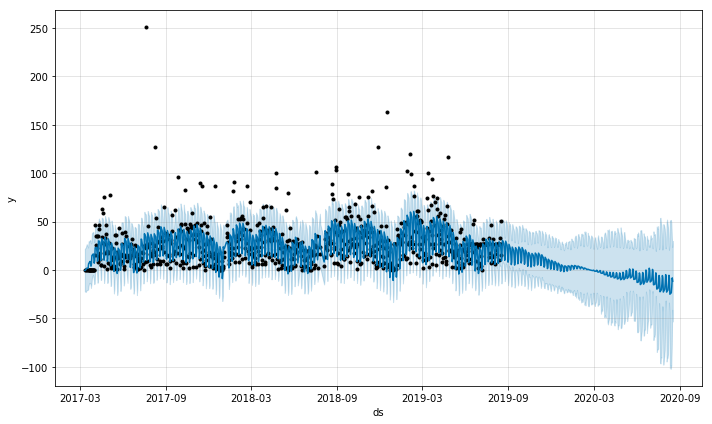

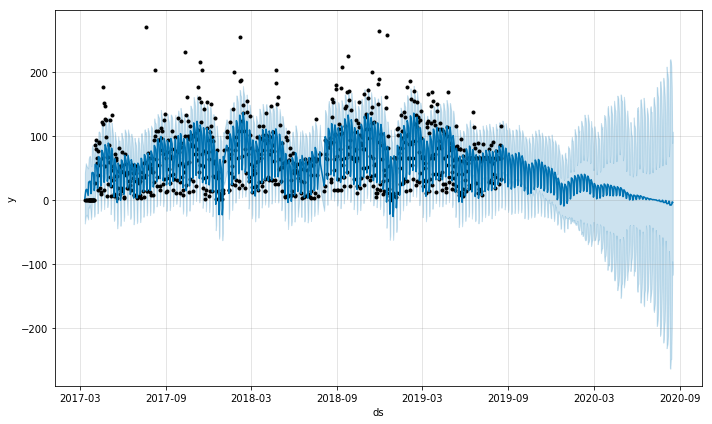

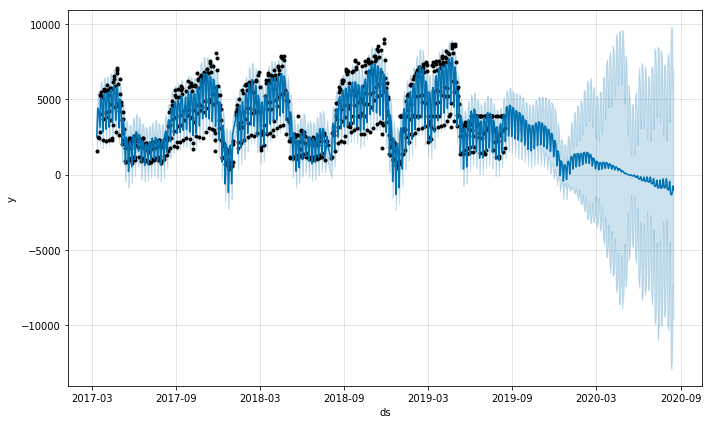

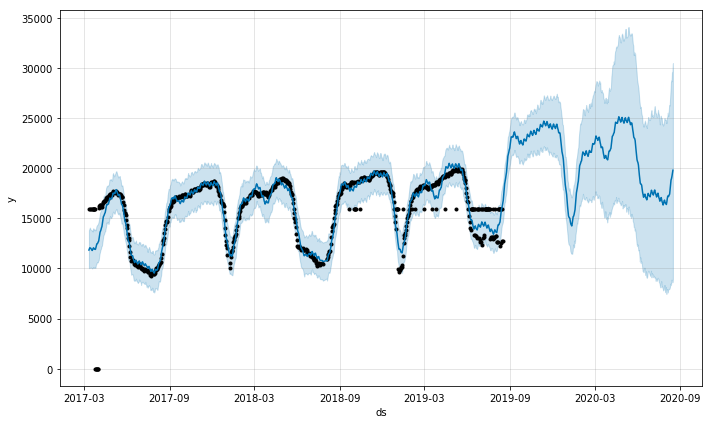

In [54]:
prediction = send_prediction(five_att)

The send_predictionMape function when a attributes are provided plot the mape error values across time.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


MAPE for google_forms_created predictions
MAPE way too low to be graphed, prediction is very good


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


MAPE for google_forms_edited predictions
MAPE way too low to be graphed, prediction is very good


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


MAPE for 1day_active_users predictions


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


MAPE for 30day_active_users predictions


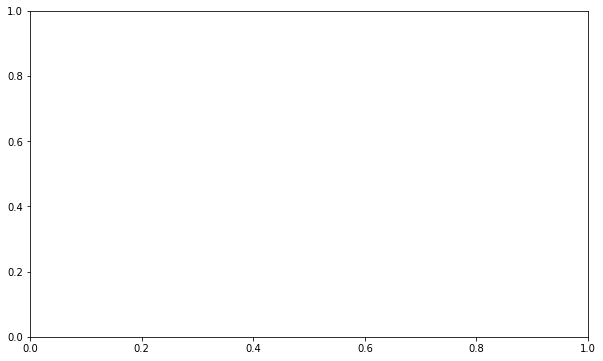

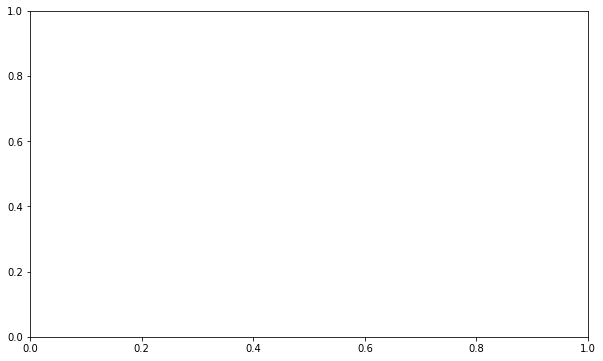

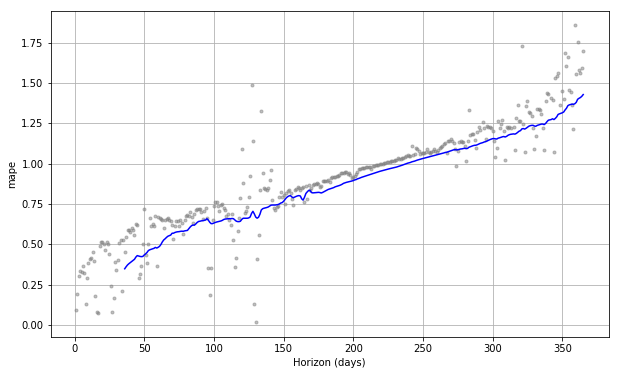

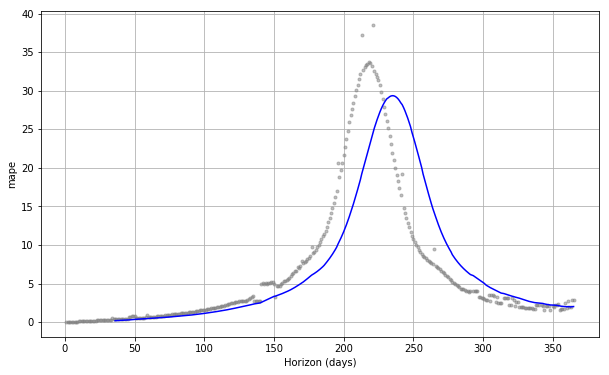

In [44]:
prediction1 = send_predictionMAPE(five_att)


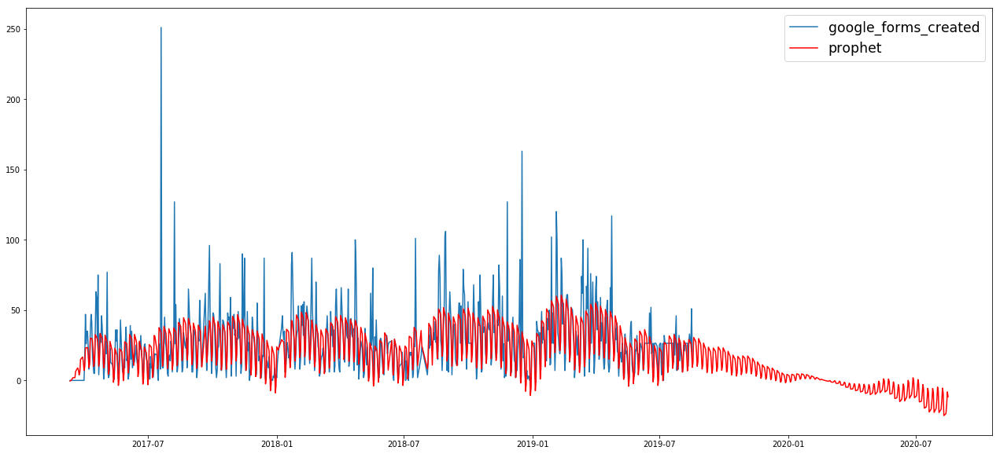

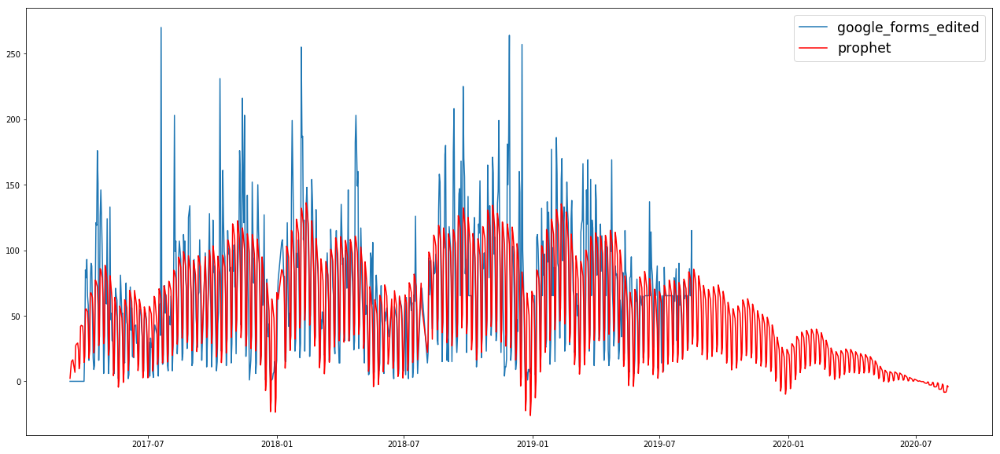

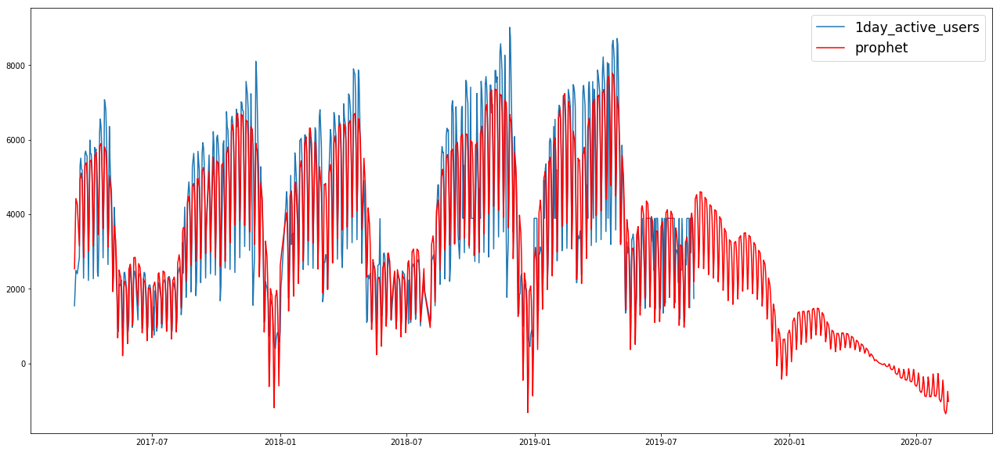

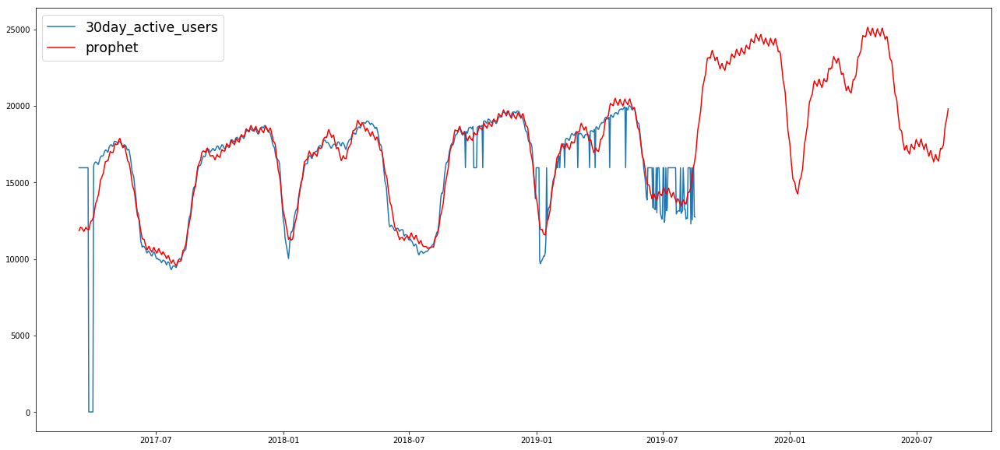

In [62]:
plot(five_att,prediction)

In [63]:
prediction

,time,google_forms_created,google_forms_edited,1day_active_users,30day_active_users
0,2017-03-12,-0.430970,2.257448,2536.031583,11841.085243
1,2017-03-14,0.268981,15.072758,4420.806798,12069.931256
2,2017-03-16,1.917188,16.421074,4265.215938,12019.552882
3,2017-03-19,1.963986,6.824772,3151.410971,11796.214199
4,2017-03-20,6.435084,26.999055,4944.922844,11880.273600
5,2017-03-21,7.313269,28.253957,5012.287100,12001.124716
6,2017-03-22,8.138500,28.692972,5101.356780,12067.736315
7,2017-03-23,8.879448,29.200432,4816.823507,11976.832182
8,2017-03-24,7.311217,23.962066,4106.582914,11928.623256
9,2017-03-25,3.935496,9.551966,2837.330096,11931.081672


In [70]:
five_att= pick_your_poison(2)

you picked the entire data set


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  4.559612e+06  2135.324830  1828.345733  0.348800  0.250000
1 37 days  4.734881e+06  2175.978061  1892.799573  0.361320  0.222222
2 38 days  5.274805e+06  2296.694355  1999.752752  0.372324  0.194444
3 39 days  5.745301e+06  2396.935653  2076.711272  0.380268  0.194444
4 40 days  6.113416e+06  2472.532296  2137.253538  0.387025  0.194444
Performance tail for 1day_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.944462e+07  4409.605355  4256.916939  1.399469  0.916667
322 362 days  2.035918e+07  4512.114600  4366.642512  1.405610  0.916667
323 363 days  2.087004e+07  4568.373387  4415.849855  1.410375  0.916667
324 364 days  2.081553e+07  4562.404513  4410.432425  1.418063  0.916667
325 365 days  2.033001e+07  4508.881241  4350.313162  1.428707  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_documents_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.205650e+06  1790.433047  1576.138789  0.451572  0.250000
1 37 days  3.330488e+06  1824.962371  1627.637788  0.462718  0.222222
2 38 days  3.676540e+06  1917.430644  1710.087969  0.472945  0.194444
3 39 days  3.974717e+06  1993.669215  1768.488535  0.480182  0.194444
4 40 days  4.232630e+06  2057.335711  1818.616742  0.486767  0.194444
Performance tail for 1day_google_documents_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  8.686398e+06  2947.269650  2807.373767  1.596811  0.916667
322 362 days  9.165566e+06  3027.468509  2890.763057  1.596675  0.916667
323 363 days  9.467589e+06  3076.944783  2933.456181  1.596866  0.916667
324 364 days  9.336903e+06  3055.634676  2913.754313  1.609779  0.916667
325 365 days  9.054891e+06  3009.134632  2861.654564  1.627774  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_drawings_active_users
  horizon        mse      rmse       mae  coverage
0 36 days  59.954650  7.743039  6.071307  0.388889
1 37 days  61.822317  7.862717  6.215719  0.361111
2 38 days  66.358190  8.146054  6.448319  0.361111
3 39 days  53.411170  7.308295  5.875246  0.388889
4 40 days  55.285862  7.435446  5.960156  0.388889
Performance tail for 1day_google_drawings_active_users
     horizon         mse       rmse        mae  coverage
321 361 days  142.330539  11.930236  11.292029  0.222222
322 362 days  148.794604  12.198139  11.592495  0.194444
323 363 days  141.579419  11.898715  11.393448  0.194444
324 364 days  140.680507  11.860881  11.360064  0.194444
325 365 days  135.198661  11.627496  11.080916  0.222222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_forms_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  1140.724491  33.774613  26.682112  0.392032  0.444444
1 37 days  1161.204265  34.076447  27.288565  0.399971  0.416667
2 38 days  1416.123432  37.631415  29.653915  0.404127  0.388889
3 39 days  1514.753480  38.919834  30.748226  0.410805  0.388889
4 40 days  1616.864287  40.210251  31.754466  0.416918  0.388889
Performance tail for 1day_google_forms_active_users
     horizon         mse       rmse        mae      mape  coverage
321 361 days  439.179965  20.956621  15.559981  0.318569  0.888889
322 362 days  441.385083  21.009167  15.734369  0.313601  0.888889
323 363 days  434.327246  20.840519  15.436397  0.308827  0.888889
324 364 days  492.629256  22.195253  16.445206  0.316789  0.888889
325 365 days  487.932155  22.089186  16.119056  0.311499  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_presentations_active_users
  horizon            mse        rmse         mae      mape  coverage
0 36 days  251563.320680  501.560884  443.421670  0.898302  0.138889
1 37 days  263996.997814  513.806382  460.060181  0.913023  0.111111
2 38 days  296024.560371  544.081391  485.748124  0.925894  0.083333
3 39 days  324660.008344  569.789442  507.163800  0.937940  0.083333
4 40 days  347029.574834  589.092162  523.346248  0.947692  0.083333
Performance tail for 1day_google_presentations_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.207457e+06  1485.751277  1359.237401  5.665253  0.916667
322 362 days  2.373103e+06  1540.487995  1410.027150  5.541731  0.916667
323 363 days  2.460834e+06  1568.704697  1432.510132  5.431470  0.916667
324 364 days  2.425322e+06  1557.344463  1421.627296  5.497785  0.916667
325 365 days  2.370682e+06  1539.701895  1401.089290  5.647541  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_sites_active_users
  horizon         mse       rmse        mae  coverage
0 36 days  199.994551  14.141943  11.821728  0.305556
1 37 days  205.250496  14.326566  12.109250  0.277778
2 38 days  223.877544  14.962538  12.740794  0.250000
3 39 days  259.960000  16.123275  13.517409  0.250000
4 40 days  327.401589  18.094242  14.544605  0.250000
Performance tail for 1day_google_sites_active_users
     horizon          mse       rmse        mae  coverage
321 361 days  1789.724194  42.305132  41.762002       1.0
322 362 days  1819.508247  42.655694  42.115495       1.0
323 363 days  1820.030330  42.661813  42.120923       1.0
324 364 days  1802.181817  42.452112  41.902479       1.0
325 365 days  1764.951913  42.011331  41.377591       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_google_spreadsheets_active_users
  horizon            mse        rmse         mae      mape  coverage
0 36 days  117281.806536  342.464314  286.405742  0.219785  0.611111
1 37 days  116948.679045  341.977600  285.096687  0.215507  0.611111
2 38 days  127743.110199  357.411682  301.083419  0.222215  0.583333
3 39 days  134864.980670  367.239677  311.327307  0.227036  0.555556
4 40 days  140388.153009  374.684071  318.036692  0.230269  0.527778
Performance tail for 1day_google_spreadsheets_active_users
     horizon            mse        rmse         mae      mape  coverage
321 361 days  186095.729737  431.388143  361.637055  0.354126  0.888889
322 362 days  183377.411215  428.225888  353.062922  0.338931  0.888889
323 363 days  176887.357231  420.579787  340.518623  0.329315  0.888889
324 364 days  182212.573499  426.863647  347.175801  0.332192  0.888889
325 365 days  180835.239398  425.247269  344.310473  0.332330  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 1day_other_types_active_users
  horizon            mse        rmse         mae      mape  coverage
0 36 days  159929.783607  399.912220  344.351935  0.221486  0.527778
1 37 days  162201.043127  402.741906  349.785204  0.223964  0.527778
2 38 days  199014.806813  446.110756  380.975850  0.234926  0.500000
3 39 days  225007.164396  474.349201  398.621843  0.240680  0.500000
4 40 days  239307.082440  489.190231  410.247140  0.245285  0.500000
Performance tail for 1day_other_types_active_users
     horizon            mse        rmse         mae      mape  coverage
321 361 days  470310.068736  685.791564  633.225127  0.531288  0.888889
322 362 days  473413.436345  688.050461  637.685840  0.526675  0.888889
323 363 days  467899.839751  684.032046  632.581321  0.522890  0.888889
324 364 days  473655.136125  688.226079  636.761384  0.524301  0.888889
325 365 days  463717.711263  680.968216  625.500195  0.520448  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.538338e+07  3922.165470  3313.591186  0.186350  0.277778
1 37 days  1.655746e+07  4069.086017  3487.088168  0.195763  0.250000
2 38 days  1.779181e+07  4218.034187  3661.500239  0.205064  0.222222
3 39 days  1.914011e+07  4374.940745  3843.615074  0.214726  0.194444
4 40 days  2.054261e+07  4532.395513  4027.450001  0.224465  0.166667
Performance tail for 30day_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  8.379487e+08  28947.343334  28846.815274  2.009788  0.250000
322 362 days  8.309449e+08  28826.115662  28740.556430  1.990165  0.250000
323 363 days  8.263767e+08  28746.768179  28672.252198  1.974130  0.277778
324 364 days  8.336878e+08  28873.652966  28779.320060  1.996623  0.277778
325 365 days  8.428079e+08  29031.153851  28913.022237  2.021047  0.277778


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_documents_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  8.030009e+06  2833.726985  2235.502136  0.158898  0.333333
1 37 days  8.693802e+06  2948.525363  2368.476001  0.167624  0.305556
2 38 days  9.403188e+06  3066.461862  2503.574419  0.176286  0.277778
3 39 days  1.018310e+07  3191.096560  2648.442574  0.185626  0.250000
4 40 days  1.099915e+07  3316.496229  2796.032474  0.195108  0.222222
Performance tail for 30day_google_documents_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  3.119358e+08  17661.704509  17530.189738  1.886547  0.444444
322 362 days  3.076170e+08  17539.014965  17423.356603  1.850439  0.472222
323 363 days  3.043394e+08  17445.324896  17344.300193  1.817644  0.500000
324 364 days  3.107734e+08  17628.766745  17497.894361  1.855844  0.500000
325 365 days  3.179986e+08  17832.515620  17670.646297  1.895663  0.472222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_drawings_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  5441.701906  73.767892  70.009734  0.443627  0.055556
1 37 days  5561.043380  74.572404  71.534226  0.452418  0.027778
2 38 days  5689.940812  75.431696  73.117883  0.461138  0.000000
3 39 days  5769.237535  75.955497  73.983734  0.465144  0.000000
4 40 days  5837.113847  76.401007  74.673973  0.468108  0.000000
Performance tail for 30day_google_drawings_active_users
     horizon          mse       rmse        mae      mape  coverage
321 361 days  6851.613284  82.774472  80.032205  0.721643       1.0
322 362 days  7070.883138  84.088543  81.403061  0.726776       1.0
323 363 days  7294.161509  85.405863  82.798573  0.732140       1.0
324 364 days  7144.376388  84.524413  81.841051  0.731644       1.0
325 365 days  6979.781248  83.545085  80.759485  0.730858       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_forms_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  7061.533464  84.032931  72.302130  0.082546  0.777778
1 37 days  7512.719786  86.675947  74.810832  0.084966  0.750000
2 38 days  8039.513268  89.663333  77.516406  0.087439  0.722222
3 39 days  8649.973380  93.005233  80.423422  0.090053  0.694444
4 40 days  9094.951152  95.367453  82.725348  0.091990  0.666667
Performance tail for 30day_google_forms_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.076465e+06  1440.994348  1436.547032  2.134521  0.083333
322 362 days  2.099403e+06  1448.931773  1443.591530  2.129077  0.083333
323 363 days  2.125180e+06  1457.799663  1451.309096  2.126513  0.083333
324 364 days  2.164857e+06  1471.345327  1463.303077  2.145759  0.083333
325 365 days  2.205184e+06  1484.986362  1475.623816  2.165610  0.083333


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_presentations_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.412212e+06  1188.365467   948.748143  0.247130  0.277778
1 37 days  1.583754e+06  1258.472746  1016.047290  0.261426  0.250000
2 38 days  1.772191e+06  1331.236529  1084.649869  0.274813  0.222222
3 39 days  1.983698e+06  1408.438081  1154.829704  0.287424  0.194444
4 40 days  2.198836e+06  1482.847304  1224.788771  0.299769  0.166667
Performance tail for 30day_google_presentations_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.139403e+07  3375.504299  3114.275786  1.445330  0.527778
322 362 days  1.093396e+07  3306.653976  3049.592903  1.393343  0.555556
323 363 days  1.043965e+07  3231.045223  2983.672766  1.340368  0.583333
324 364 days  1.091811e+07  3304.256843  3045.465981  1.395826  0.555556
325 365 days  1.140897e+07  3377.716564  3111.581027  1.452279  0.527778


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_sites_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  6642.946667  81.504274  70.636435  0.338767  0.083333
1 37 days  7100.483540  84.264367  74.103687  0.352413  0.055556
2 38 days  7591.335765  87.128272  77.748749  0.366669  0.027778
3 39 days  8190.557756  90.501700  81.699910  0.380985  0.000000
4 40 days  9040.961780  95.083972  86.274074  0.395328  0.000000
Performance tail for 30day_google_sites_active_users
     horizon           mse        rmse         mae      mape  coverage
321 361 days  23180.346398  152.250932  144.435651  0.619693       1.0
322 362 days  23935.217273  154.710107  146.933452  0.625221       1.0
323 363 days  24639.177681  156.968716  149.201417  0.630140       1.0
324 364 days  24092.172445  155.216534  147.289025  0.628339       1.0
325 365 days  23534.863464  153.410767  145.359806  0.626442       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_google_spreadsheets_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.070019e+06  1752.146987  1394.387104  0.197535  0.333333
1 37 days  3.396128e+06  1842.858654  1484.086983  0.209932  0.305556
2 38 days  3.737666e+06  1933.304516  1574.454420  0.222060  0.277778
3 39 days  4.106475e+06  2026.443942  1666.145905  0.234095  0.250000
4 40 days  4.480895e+06  2116.812466  1759.174940  0.246279  0.222222
Performance tail for 30day_google_spreadsheets_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  1.233462e+08  11106.131937  11079.418136  1.797203  0.416667
322 362 days  1.237778e+08  11125.545924  11096.756801  1.795070  0.416667
323 363 days  1.244762e+08  11156.889364  11124.403117  1.796146  0.416667
324 364 days  1.261298e+08  11230.753543  11187.481264  1.817231  0.416667
325 365 days  1.279343e+08  11310.804081  11256.670482  1.839700  0.416667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 30day_other_types_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  7.308954e+06  2703.507696  2306.148110  0.193700  0.250000
1 37 days  7.860220e+06  2803.608416  2424.315451  0.203682  0.222222
2 38 days  8.401618e+06  2898.554385  2538.990714  0.213041  0.194444
3 39 days  8.979064e+06  2996.508576  2654.559254  0.222318  0.166667
4 40 days  9.563454e+06  3092.483520  2767.428283  0.231361  0.138889
Performance tail for 30day_other_types_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  4.429147e+08  21045.538369  20984.108750  2.200556       0.0
322 362 days  4.400890e+08  20978.298049  20924.649173  2.178151       0.0
323 363 days  4.380277e+08  20929.110904  20882.062420  2.158520       0.0
324 364 days  4.413421e+08  21008.143255  20950.015997  2.178193       0.0
325 365 days  4.453174e+08  21102.545960  21031.943422  2.199581       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.976613e+06  1994.144597  1511.847115  0.126537  0.638889
1 37 days  4.178672e+06  2044.179957  1578.973665  0.131405  0.611111
2 38 days  4.330886e+06  2081.078143  1639.384404  0.135690  0.583333
3 39 days  4.488904e+06  2118.703406  1697.691544  0.139725  0.555556
4 40 days  4.648750e+06  2156.095967  1756.096733  0.143787  0.527778
Performance tail for 7day_active_users
     horizon           mse          rmse           mae      mape  coverage
321 361 days  1.949171e+08  13961.269727  13843.269031  1.764170       1.0
322 362 days  1.978399e+08  14065.556961  13934.068075  1.757888       1.0
323 363 days  2.017864e+08  14205.152676  14053.268670  1.756331       1.0
324 364 days  2.116102e+08  14546.828940  14334.810491  1.809743       1.0
325 365 days  2.225252e+08  14917.279181  14638.850087  1.864860       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_documents_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.159701e+06  1469.592149  1056.555433  0.119982  0.722222
1 37 days  2.224594e+06  1491.507309  1088.598136  0.122418  0.694444
2 38 days  2.264375e+06  1504.784149  1111.990299  0.124009  0.694444
3 39 days  2.294799e+06  1514.859552  1127.798162  0.124707  0.694444
4 40 days  2.320957e+06  1523.468901  1141.129817  0.125240  0.694444
Performance tail for 7day_google_documents_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  5.253509e+07  7248.109138  7071.363189  1.482991       1.0
322 362 days  5.258434e+07  7251.505719  7074.106271  1.446627       1.0
323 363 days  5.300686e+07  7280.581007  7096.672531  1.415325       1.0
324 364 days  5.719426e+07  7562.688530  7313.220175  1.483926       1.0
325 365 days  6.185869e+07  7865.029320  7544.406963  1.554116       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_drawings_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  1413.118800  37.591472  34.765094  0.622028       0.0
1 37 days  1449.118704  38.067292  35.396835  0.630405       0.0
2 38 days  1492.851247  38.637433  36.071997  0.638402       0.0
3 39 days  1485.945774  38.547967  35.985467  0.641130       0.0
4 40 days  1452.144786  38.107018  35.620995  0.642671       0.0
Performance tail for 7day_google_drawings_active_users
     horizon           mse        rmse         mae      mape  coverage
321 361 days  10684.782441  103.367221  102.967061  3.354068       0.0
322 362 days  10797.298201  103.910049  103.489475  3.353902       0.0
323 363 days  10879.767925  104.306126  103.870063  3.354579       0.0
324 364 days  10882.907911  104.321177  103.884826  3.378493       0.0
325 365 days  10860.117755  104.211889  103.777556  3.409529       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_forms_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  2684.543851  51.812584  43.100991  0.113518  0.638889
1 37 days  2919.931476  54.036390  45.087449  0.117222  0.611111
2 38 days  3335.163580  57.750875  47.750850  0.121686  0.583333
3 39 days  3897.235015  62.427838  51.372394  0.128276  0.555556
4 40 days  4691.729515  68.496201  55.794774  0.136063  0.527778
Performance tail for 7day_google_forms_active_users
     horizon            mse        rmse         mae      mape  coverage
321 361 days   88631.612885  297.710619  281.487277  1.143890       1.0
322 362 days   93306.141953  305.460541  287.467756  1.143077       1.0
323 363 days   98511.177482  313.864903  294.109497  1.148621       1.0
324 364 days  103627.403176  321.912105  302.201862  1.169494       1.0
325 365 days  109060.097766  330.242483  310.642280  1.191745       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_presentations_active_users
  horizon            mse        rmse         mae      mape  coverage
0 36 days  424912.591701  651.853198  492.083425  0.263112  0.444444
1 37 days  444725.655135  666.877541  514.299113  0.271607  0.416667
2 38 days  455770.639532  675.107873  531.744570  0.278119  0.388889
3 39 days  465074.662138  681.963828  547.505366  0.283764  0.361111
4 40 days  477478.663914  690.998310  564.055351  0.289192  0.333333
Performance tail for 7day_google_presentations_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.293934e+06  1137.512209   991.280433  1.299745       1.0
322 362 days  1.218521e+06  1103.866564   965.478088  1.203311       1.0
323 363 days  1.147975e+06  1071.435867   941.353592  1.112397       1.0
324 364 days  1.274457e+06  1128.918535   987.251680  1.179919       1.0
325 365 days  1.426040e+06  1194.169106  1037.418028  1.253401       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_sites_active_users
  horizon          mse       rmse        mae      mape  coverage
0 36 days  2565.844373  50.654164  46.874680  0.540611       0.0
1 37 days  2815.493390  53.061223  49.146963  0.553733       0.0
2 38 days  3072.590737  55.430955  51.500205  0.567617       0.0
3 39 days  3390.090562  58.224484  54.047953  0.580468       0.0
4 40 days  3872.893951  62.232579  57.065730  0.591533       0.0
Performance tail for 7day_google_sites_active_users
     horizon          mse       rmse        mae      mape  coverage
321 361 days  2508.390008  50.083830  46.605973  0.490135       1.0
322 362 days  2623.573910  51.220835  48.023364  0.500466       1.0
323 363 days  2733.028212  52.278372  49.274192  0.508927       1.0
324 364 days  2641.537607  51.395891  48.141406  0.502316       1.0
325 365 days  2549.960464  50.497133  47.009668  0.495732       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_google_spreadsheets_active_users
  horizon            mse        rmse         mae      mape  coverage
0 36 days  683660.290424  826.837524  645.764092  0.165924  0.527778
1 37 days  711813.916573  843.690652  671.530299  0.171867  0.500000
2 38 days  730845.609353  854.895087  690.855865  0.176031  0.472222
3 39 days  749186.436015  865.555565  707.274891  0.179372  0.444444
4 40 days  764109.245375  874.133425  722.367042  0.182466  0.416667
Performance tail for 7day_google_spreadsheets_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  5.936400e+06  2436.472865  2334.571376  0.773659       1.0
322 362 days  6.318560e+06  2513.674539  2409.843143  0.796280       1.0
323 363 days  6.743757e+06  2596.874446  2492.462017  0.821417       1.0
324 364 days  7.206688e+06  2684.527536  2569.900261  0.846435       1.0
325 365 days  7.702624e+06  2775.360082  2650.534227  0.872247       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for 7day_other_types_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.730737e+06  1315.574950  1119.014201  0.198646  0.277778
1 37 days  1.789725e+06  1337.806032  1155.330131  0.204346  0.250000
2 38 days  1.819676e+06  1348.953628  1181.707808  0.208178  0.222222
3 39 days  1.849227e+06  1359.862913  1209.056541  0.212108  0.194444
4 40 days  1.881731e+06  1371.762125  1237.750874  0.216251  0.166667
Performance tail for 7day_other_types_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  7.159721e+07  8461.513598  8402.964506  1.961713  0.972222
322 362 days  7.308242e+07  8548.825608  8475.544780  1.953069  0.972222
323 363 days  7.488594e+07  8653.666376  8561.538367  1.948284  1.000000
324 364 days  7.812314e+07  8838.729414  8716.838534  1.990278  1.000000
325 365 days  8.166101e+07  9036.648304  8882.704758  2.033404  1.000000


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for collaborators
  horizon            mse        rmse         mae      mape  coverage
0 36 days  402265.518826  634.244053  533.276904  0.485100  0.277778
1 37 days  415623.595448  644.688759  552.186032  0.503462  0.250000
2 38 days  472122.174151  687.111471  591.383734  0.523193  0.222222
3 39 days  519439.118759  720.721249  620.364825  0.535555  0.222222
4 40 days  562644.457306  750.096299  644.399728  0.545405  0.222222
Performance tail for collaborators
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.238051e+06  1496.011567  1404.085035  2.355719  0.916667
322 362 days  2.377422e+06  1541.889210  1453.382059  2.342879  0.916667
323 363 days  2.440666e+06  1562.262971  1470.327912  2.341565  0.916667
324 364 days  2.424976e+06  1557.233442  1465.856000  2.350885  0.916667
325 365 days  2.354441e+06  1534.418841  1438.471903  2.379001  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for consumers
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.925242e+06  1710.333813  1425.202098  0.315474  0.388889
1 37 days  3.032053e+06  1741.279137  1474.529444  0.326242  0.361111
2 38 days  3.421722e+06  1849.789752  1565.763496  0.336483  0.333333
3 39 days  3.748563e+06  1936.120522  1630.870876  0.343956  0.333333
4 40 days  4.005432e+06  2001.357424  1682.226531  0.350200  0.333333
Performance tail for consumers
     horizon           mse         rmse          mae      mape  coverage
321 361 days  8.701994e+06  2949.914275  2815.722024  1.109117  0.916667
322 362 days  9.082233e+06  3013.674303  2891.172442  1.112130  0.916667
323 363 days  9.313119e+06  3051.740318  2927.127536  1.114886  0.916667
324 364 days  9.236900e+06  3039.226835  2915.436850  1.118426  0.916667
325 365 days  8.977808e+06  2996.299099  2864.945754  1.122797  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for creators
  horizon            mse        rmse         mae      mape  coverage
0 36 days  761114.930749  872.419011  725.169984  0.374026  0.361111
1 37 days  783714.155376  885.276316  747.234650  0.385706  0.333333
2 38 days  860423.893985  927.590370  786.463562  0.395997  0.305556
3 39 days  930846.831366  964.804038  811.718458  0.402366  0.305556
4 40 days  978202.258224  989.041080  829.772150  0.408102  0.305556
Performance tail for creators
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.607009e+06  1267.678452  1200.480735  1.328697  0.916667
322 362 days  1.692039e+06  1300.784159  1236.503860  1.333599  0.916667
323 363 days  1.743181e+06  1320.295839  1253.575502  1.336853  0.916667
324 364 days  1.721405e+06  1312.023233  1245.854504  1.345195  0.916667
325 365 days  1.668560e+06  1291.727634  1221.879673  1.358724  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_documents_created
  horizon           mse         rmse         mae      mape  coverage
0 36 days  8.473984e+05   920.542473  755.458905  0.399706  0.361111
1 37 days  8.712425e+05   933.403697  779.161101  0.412913  0.333333
2 38 days  9.648696e+05   982.277757  823.515253  0.424273  0.305556
3 39 days  1.052272e+06  1025.802931  852.348101  0.430658  0.305556
4 40 days  1.104222e+06  1050.819783  871.234490  0.436500  0.305556
Performance tail for google_documents_created
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.343516e+06  1159.101186  1078.412907  1.418816  0.944444
322 362 days  1.418653e+06  1191.072326  1111.501525  1.419036  0.944444
323 363 days  1.464168e+06  1210.028021  1127.554052  1.419077  0.944444
324 364 days  1.425411e+06  1193.905976  1111.976705  1.432117  0.944444
325 365 days  1.372022e+06  1171.333393  1085.927229  1.452149  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_documents_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.825599e+06  1955.913934  1705.564438  0.526109  0.222222
1 37 days  3.964877e+06  1991.199814  1760.076581  0.537504  0.194444
2 38 days  4.414299e+06  2101.023267  1857.231961  0.548775  0.166667
3 39 days  4.842382e+06  2200.541188  1931.012146  0.556795  0.166667
4 40 days  5.166901e+06  2273.081725  1987.260045  0.563807  0.166667
Performance tail for google_documents_edited
     horizon           mse         rmse          mae      mape  coverage
321 361 days  9.056475e+06  3009.397744  2833.813336  1.885852  0.944444
322 362 days  9.549473e+06  3090.222219  2916.091084  1.879351  0.944444
323 363 days  9.801716e+06  3130.769291  2949.642010  1.873060  0.944444
324 364 days  9.543935e+06  3089.325898  2910.749978  1.890720  0.944444
325 365 days  9.177467e+06  3029.433523  2841.777623  1.919263  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_documents_trashed
  horizon          mse       rmse        mae      mape  coverage
0 36 days  4495.587749  67.049144  52.475181  0.364132  0.833333
1 37 days  4308.390009  65.638327  50.622374  0.340773  0.833333
2 38 days  4121.380650  64.197980  48.926446  0.322612  0.833333
3 39 days  4324.555951  65.761356  50.704648  0.328315  0.833333
4 40 days  4935.664281  70.254283  53.687392  0.336326  0.805556
Performance tail for google_documents_trashed
     horizon          mse       rmse        mae      mape  coverage
321 361 days  5197.549343  72.094031  53.942190  0.661378  0.944444
322 362 days  5789.584156  76.089317  56.474579  0.594262  0.944444
323 363 days  6414.607407  80.091244  60.547567  0.618894  0.944444
324 364 days  7321.757657  85.567270  64.452611  0.670066  0.944444
325 365 days  7542.918837  86.849979  66.189859  0.689755  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_documents_viewed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  6.494808e+06  2548.491371  2249.382037  0.535879  0.194444
1 37 days  6.739844e+06  2596.120887  2321.079781  0.546843  0.166667
2 38 days  7.576987e+06  2752.632810  2459.074341  0.559990  0.138889
3 39 days  8.414727e+06  2900.814908  2574.352380  0.570220  0.138889
4 40 days  9.109788e+06  3018.242615  2668.011988  0.578540  0.138889
Performance tail for google_documents_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.725922e+07  5221.035942  4983.525422  2.105368  0.972222
322 362 days  2.867759e+07  5355.145931  5126.918032  2.094611  0.972222
323 363 days  2.933869e+07  5416.520304  5179.332312  2.088446  0.972222
324 364 days  2.877566e+07  5364.294791  5129.031833  2.106768  0.972222
325 365 days  2.780172e+07  5272.733458  5021.233513  2.130093  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_drawings_created
  horizon           mse         rmse          mae  coverage
0 36 days  8.127805e+06  2850.930496  2309.214813       0.0
1 37 days  8.763367e+06  2960.298466  2440.119256       0.0
2 38 days  9.390505e+06  3064.393007  2569.261678       0.0
3 39 days  1.000492e+07  3163.056133  2696.617506       0.0
4 40 days  1.059920e+07  3255.641174  2819.950506       0.0
Performance tail for google_drawings_created
     horizon          mse       rmse        mae  coverage
321 361 days   482.793033  21.972552  17.325371      0.25
322 362 days   485.521262  22.034547  17.432568      0.25
323 363 days   507.322836  22.523828  17.804656      0.25
324 364 days   955.950866  30.918455  20.816169      0.25
325 365 days  1753.067977  41.869655  25.204979      0.25


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_drawings_edited
  horizon           mse        rmse         mae  coverage
0 36 days  29474.794184  171.682248  161.313791       0.0
1 37 days  29763.738526  172.521705  163.306919       0.0
2 38 days  29947.019396  173.052071  164.608067       0.0
3 39 days  30172.775571  173.703125  166.370608       0.0
4 40 days  30258.305863  173.949147  166.931468       0.0
Performance tail for google_drawings_edited
     horizon         mse       rmse        mae  coverage
321 361 days  198.307072  14.082154  11.788450  0.305556
322 362 days  252.053831  15.876203  12.958554  0.277778
323 363 days  321.174686  17.921347  14.109595  0.277778
324 364 days  534.539262  23.120105  16.321700  0.250000
325 365 days  763.937327  27.639416  18.631053  0.250000


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_drawings_trashed
  horizon       mse      rmse       mae  coverage
0 36 days  1.562590  1.250036  0.707799  0.888889
1 37 days  1.552724  1.246083  0.692560  0.888889
2 38 days  1.542237  1.241868  0.682579  0.888889
3 39 days  1.509382  1.228569  0.667518  0.888889
4 40 days  1.501785  1.225473  0.658495  0.888889
Performance tail for google_drawings_trashed
     horizon       mse      rmse       mae  coverage
321 361 days  1.307306  1.143375  0.782809  0.972222
322 362 days  1.308063  1.143706  0.783172  0.972222
323 363 days  1.330603  1.153518  0.801971  0.972222
324 364 days  1.319161  1.148547  0.791269  0.972222
325 365 days  1.352321  1.162893  0.806888  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_drawings_viewed
  horizon           mse        rmse         mae  coverage
0 36 days  11378.873432  106.671802  100.441633       0.0
1 37 days  11555.991251  107.498797  102.087726       0.0
2 38 days  11700.803156  108.170251  103.456188       0.0
3 39 days  11882.953582  109.008961  105.271308       0.0
4 40 days  11966.068032  109.389524  106.099869       0.0
Performance tail for google_drawings_viewed
     horizon         mse       rmse        mae  coverage
321 361 days   91.045939   9.541800   7.606697  0.944444
322 362 days  104.620719  10.228427   8.194052  0.944444
323 363 days  125.314940  11.194416   8.835338  0.944444
324 364 days  167.595008  12.945849   9.771240  0.944444
325 365 days  211.488701  14.542651  10.767918  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_created
  horizon         mse       rmse        mae  coverage
0 36 days  783.157925  27.984959  20.062828  0.666667
1 37 days  781.349057  27.952622  19.973712  0.666667
2 38 days  844.116990  29.053692  21.151266  0.638889
3 39 days  803.095352  28.338937  20.640251  0.638889
4 40 days  734.848140  27.108083  19.856388  0.638889
Performance tail for google_forms_created
     horizon         mse       rmse        mae  coverage
321 361 days  172.320680  13.127097  11.064533  0.972222
322 362 days  174.905263  13.225175  11.309869  0.972222
323 363 days  167.655407  12.948182  11.053992  0.972222
324 364 days  208.907342  14.453627  11.864300  0.972222
325 365 days  208.936718  14.454643  11.865528  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_edited
  horizon          mse       rmse        mae  coverage
0 36 days  3372.733772  58.075242  42.938540  0.500000
1 37 days  3449.573302  58.733068  44.388143  0.472222
2 38 days  4168.669274  64.565233  48.588589  0.444444
3 39 days  4421.431669  66.493847  50.308825  0.444444
4 40 days  4539.006606  67.372150  51.021836  0.444444
Performance tail for google_forms_edited
     horizon          mse       rmse        mae  coverage
321 361 days  3809.600978  61.721965  58.615256  0.888889
322 362 days  3937.183068  62.746977  60.298405  0.888889
323 363 days  3875.999032  62.257522  59.894197  0.888889
324 364 days  4156.506111  64.470971  61.461978  0.888889
325 365 days  4083.535376  63.902546  60.702475  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_trashed
  horizon        mse      rmse       mae  coverage
0 36 days  67.091988  8.190970  6.662721  0.555556
1 37 days  68.388256  8.269719  6.849956  0.527778
2 38 days  69.598706  8.342584  7.007474  0.527778
3 39 days  71.623629  8.463074  7.184106  0.500000
4 40 days  74.398808  8.625474  7.437738  0.472222
Performance tail for google_forms_trashed
     horizon         mse       rmse        mae  coverage
321 361 days  126.953813  11.267378   9.571149       1.0
322 362 days  135.904809  11.657822  10.054981       1.0
323 363 days  144.097394  12.004057  10.461879       1.0
324 364 days  141.821007  11.908863  10.328188       1.0
325 365 days  139.539627  11.812689  10.176427       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_forms_viewed
  horizon         mse       rmse        mae  coverage
0 36 days  283.670360  16.842516   9.997487  0.805556
1 37 days  283.436936  16.835585   9.936296  0.805556
2 38 days  285.594758  16.899549  10.145051  0.805556
3 39 days  284.344125  16.862506  10.109455  0.805556
4 40 days  279.014072  16.703714   9.932432  0.833333
Performance tail for google_forms_viewed
     horizon         mse       rmse        mae  coverage
321 361 days  135.118088  11.624031  10.211832  0.972222
322 362 days  137.543623  11.727899  10.454802  0.972222
323 363 days  138.747183  11.779099  10.536341  0.972222
324 364 days  144.972386  12.040448  10.747808  0.972222
325 365 days  141.637237  11.901144  10.514531  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_presentations_created
  horizon           mse        rmse        mae      mape  coverage
0 36 days  10210.307402  101.046066  83.427669  0.602014  0.333333
1 37 days  10667.758049  103.284839  86.546807  0.614574  0.305556
2 38 days  11937.011611  109.256632  92.179877  0.632963  0.277778
3 39 days  12913.912389  113.639396  95.356747  0.641185  0.277778
4 40 days  13808.596330  117.509984  98.116247  0.648881  0.277778
Performance tail for google_presentations_created
     horizon           mse        rmse         mae      mape  coverage
321 361 days  53882.569900  232.126194  210.912382  3.396146  0.944444
322 362 days  57485.755243  239.761872  218.145774  3.260401  0.944444
323 363 days  58660.021689  242.198311  220.034508  3.233100  0.944444
324 364 days  56667.480773  238.049324  216.048579  3.289626  0.944444
325 365 days  54707.417406  233.896168  211.401872  3.359188  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_presentations_edited
  horizon           mse        rmse         mae      mape  coverage
0 36 days  61385.941956  247.761865  215.782531  0.810684  0.111111
1 37 days  64255.343355  253.486377  223.756556  0.824670  0.083333
2 38 days  72094.506215  268.504201  237.236221  0.840739  0.055556
3 39 days  79023.478558  281.111150  246.859432  0.850855  0.055556
4 40 days  84578.970301  290.824638  254.520193  0.859676  0.055556
Performance tail for google_presentations_edited
     horizon            mse        rmse         mae      mape  coverage
321 361 days  474185.323611  688.611156  632.305888  4.938117  0.944444
322 362 days  504379.948315  710.197119  652.396710  4.730454  0.944444
323 363 days  514456.961013  717.256552  657.956769  4.648701  0.944444
324 364 days  499505.626994  706.757120  647.806167  4.715552  0.944444
325 365 days  483476.464028  695.324718  634.891690  4.815024  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_presentations_trashed
  horizon         mse       rmse       mae  coverage
0 36 days  117.800168  10.853579  8.520448  0.805556
1 37 days  115.155969  10.731075  8.259891  0.805556
2 38 days  112.006064  10.583292  8.058128  0.805556
3 39 days  107.777669  10.381602  7.781270  0.833333
4 40 days  102.790908  10.138585  7.574112  0.861111
Performance tail for google_presentations_trashed
     horizon         mse       rmse        mae  coverage
321 361 days  110.898737  10.530847   8.753749  0.916667
322 362 days  118.937146  10.905831   9.167797  0.916667
323 363 days  125.023656  11.181398   9.474015  0.916667
324 364 days  140.060636  11.834722  10.008272  0.916667
325 365 days  144.338374  12.014091  10.344585  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_presentations_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  148887.632637  385.859602  341.328704  0.774791  0.111111
1 37 days  154406.927134  392.946469  352.209136  0.788745  0.083333
2 38 days  172688.076717  415.557549  371.717706  0.801261  0.055556
3 39 days  189011.794995  434.754868  386.961455  0.811662  0.055556
4 40 days  202333.163712  449.814588  398.916948  0.820169  0.055556
Performance tail for google_presentations_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.069376e+06  1034.106375   969.110150  4.264689  0.972222
322 362 days  1.140165e+06  1067.785275  1002.938640  4.135552  0.972222
323 363 days  1.175170e+06  1084.052641  1016.580554  4.082463  0.972222
324 364 days  1.157940e+06  1076.076094  1008.732624  4.129777  0.972222
325 365 days  1.128831e+06  1062.464364   992.746719  4.199603  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_sites_created
  horizon        mse      rmse       mae  coverage
0 36 days  27.834819  5.275871  3.974219  0.361111
1 37 days  28.627756  5.350491  4.092648  0.333333
2 38 days  28.964941  5.381909  4.169479  0.305556
3 39 days  37.520105  6.125366  4.653395  0.277778
4 40 days  52.710228  7.260181  5.218369  0.277778
Performance tail for google_sites_created
     horizon         mse       rmse        mae  coverage
321 361 days  159.731627  12.638498  12.526550       0.0
322 362 days  164.250213  12.816014  12.709482       0.0
323 363 days  164.161223  12.812542  12.706412       0.0
324 364 days  163.474877  12.785729  12.677344       0.0
325 365 days  162.989800  12.766746  12.658095       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_sites_edited
  horizon         mse       rmse        mae  coverage
0 36 days  207.427221  14.402334  11.868970  0.333333
1 37 days  211.856347  14.555286  12.119658  0.305556
2 38 days  223.601998  14.953327  12.591758  0.277778
3 39 days  257.652221  16.051549  13.522647  0.250000
4 40 days  322.289978  17.952437  14.536139  0.250000
Performance tail for google_sites_edited
     horizon         mse       rmse        mae  coverage
321 361 days  812.935014  28.512015  27.641039       1.0
322 362 days  831.973580  28.843952  28.033041       1.0
323 363 days  832.832497  28.858837  28.046899       1.0
324 364 days  820.624740  28.646548  27.802026       1.0
325 365 days  801.525052  28.311218  27.354135       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_sites_trashed
  horizon       mse      rmse       mae  coverage
0 36 days  1.839345  1.356224  0.946131  0.333333
1 37 days  1.844082  1.357970  0.948641  0.333333
2 38 days  1.831329  1.353266  0.941712  0.333333
3 39 days  1.942479  1.393728  0.993469  0.305556
4 40 days  2.197728  1.482474  1.075935  0.277778
Performance tail for google_sites_trashed
     horizon       mse      rmse       mae  coverage
321 361 days  0.869956  0.932714  0.672006  0.583333
322 362 days  0.852831  0.923489  0.654646  0.611111
323 363 days  0.746734  0.864138  0.607208  0.638889
324 364 days  0.801454  0.895240  0.641360  0.611111
325 365 days  0.836684  0.914705  0.667000  0.583333


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_sites_viewed
  horizon         mse       rmse        mae  coverage
0 36 days  137.719695  11.735403   9.702099  0.305556
1 37 days  142.611487  11.942005   9.982408  0.277778
2 38 days  148.676443  12.193295  10.284764  0.250000
3 39 days  176.086154  13.269746  11.077819  0.222222
4 40 days  238.153690  15.432229  12.118455  0.222222
Performance tail for google_sites_viewed
     horizon         mse       rmse        mae  coverage
321 361 days  674.939729  25.979602  25.442840       1.0
322 362 days  689.206680  26.252746  25.744099       1.0
323 363 days  686.018279  26.191951  25.690687       1.0
324 364 days  676.115130  26.002214  25.477733       1.0
325 365 days  659.558539  25.681872  25.056939       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_spreadsheets_created
  horizon          mse       rmse        mae      mape  coverage
0 36 days  5534.311598  74.392954  57.049035  0.334241  0.500000
1 37 days  5519.069821  74.290442  56.656442  0.318259  0.500000
2 38 days  5518.414822  74.286034  56.629489  0.314756  0.500000
3 39 days  5457.318270  73.873664  56.079909  0.313338  0.527778
4 40 days  5367.558420  73.263623  55.021463  0.310283  0.555556
Performance tail for google_spreadsheets_created
     horizon          mse       rmse        mae      mape  coverage
321 361 days  4258.044967  65.253697  56.270216  0.469941  0.944444
322 362 days  4559.346427  67.522933  58.854114  0.485297  0.944444
323 363 days  4739.246165  68.842183  60.071485  0.495471  0.944444
324 364 days  4590.946401  67.756523  58.520488  0.483771  0.944444
325 365 days  4491.284238  67.017044  57.230150  0.478504  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_spreadsheets_edited
  horizon           mse        rmse         mae      mape  coverage
0 36 days  67289.110510  259.401447  213.929359  0.272802  0.388889
1 37 days  67422.973782  259.659342  215.148887  0.274903  0.388889
2 38 days  69813.309532  264.222084  222.819559  0.280931  0.361111
3 39 days  70710.901464  265.915215  224.497319  0.282552  0.361111
4 40 days  72869.924172  269.944298  228.929975  0.286436  0.361111
Performance tail for google_spreadsheets_edited
     horizon            mse        rmse         mae      mape  coverage
321 361 days  105467.717982  324.757938  293.945742  0.515663  0.916667
322 362 days  105850.761661  325.347140  295.357749  0.506082  0.916667
323 363 days  103021.617061  320.969807  290.114279  0.500672  0.916667
324 364 days  106458.470425  326.279743  295.616048  0.505533  0.916667
325 365 days  105589.838326  324.945901  293.252845  0.508802  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_spreadsheets_trashed
  horizon         mse       rmse        mae  coverage
0 36 days  916.320408  30.270785  24.797977  0.805556
1 37 days  905.493305  30.091416  24.435149  0.805556
2 38 days  903.034163  30.050527  24.260043  0.805556
3 39 days  880.231402  29.668694  23.616660  0.805556
4 40 days  873.317566  29.551947  23.201495  0.805556
Performance tail for google_spreadsheets_trashed
     horizon          mse       rmse        mae  coverage
321 361 days  4378.526914  66.170438  56.363079       1.0
322 362 days  4639.015416  68.110318  58.726846       1.0
323 363 days  4630.091812  68.044778  58.680763       1.0
324 364 days  4602.022905  67.838211  58.500043       1.0
325 365 days  4539.280040  67.374179  57.949453       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for google_spreadsheets_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  133204.455136  364.971855  301.360701  0.245544  0.527778
1 37 days  133302.678039  365.106393  301.985419  0.244958  0.527778
2 38 days  140651.345472  375.035126  315.577095  0.251387  0.500000
3 39 days  145959.254722  382.046142  322.488625  0.254687  0.472222
4 40 days  150814.070236  388.347873  329.296770  0.257942  0.444444
Performance tail for google_spreadsheets_viewed
     horizon            mse        rmse         mae      mape  coverage
321 361 days  258446.191056  508.376033  457.226472  0.466250  0.888889
322 362 days  258767.024968  508.691483  458.135738  0.456138  0.888889
323 363 days  252160.115142  502.155469  449.807475  0.450357  0.888889
324 364 days  259848.266833  509.753143  457.469734  0.453927  0.888889
325 365 days  258221.111609  508.154614  454.702435  0.457136  0.888889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for items_created
  horizon           mse          rmse           mae      mape  coverage
0 36 days  4.074379e+08  20185.090356  14965.434847  1.746116  0.916667
1 37 days  4.064910e+08  20161.622869  14856.626338  1.746067  0.916667
2 38 days  3.958040e+08  19894.822339  14568.236193  1.588699  0.916667
3 39 days  4.141708e+08  20351.186461  15135.753659  1.607044  0.916667
4 40 days  4.071265e+08  20177.375366  14908.714018  1.628975  0.916667
Performance tail for items_created
     horizon           mse          rmse           mae      mape  coverage
321 361 days  4.192957e+09  64753.048403  59981.434537  6.958724       1.0
322 362 days  3.948333e+09  62835.761979  58194.244442  6.265255       1.0
323 363 days  3.745881e+09  61203.603314  56883.935522  6.029901       1.0
324 364 days  3.646487e+09  60386.150884  56129.134350  6.006826       1.0
325 365 days  3.609412e+09  60078.385973  55855.369906  6.105819       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for items_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.822333e+06  1955.078784  1546.630599  0.282619  0.805556
1 37 days  3.972022e+06  1992.993321  1603.427499  0.291026  0.805556
2 38 days  4.358820e+06  2087.778633  1695.228331  0.298321  0.777778
3 39 days  5.033526e+06  2243.552080  1799.901251  0.306259  0.750000
4 40 days  5.432411e+06  2330.753308  1874.658804  0.313877  0.722222
Performance tail for items_edited
     horizon           mse         rmse          mae      mape  coverage
321 361 days  8.886114e+06  2980.958616  2697.961651  0.777321  0.972222
322 362 days  9.232484e+06  3038.500275  2782.066606  0.788459  0.972222
323 363 days  9.508323e+06  3083.556838  2834.407543  0.796635  0.972222
324 364 days  9.471824e+06  3077.632877  2827.551963  0.801578  0.972222
325 365 days  9.269906e+06  3044.651991  2777.996807  0.805863  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for items_trashed
  horizon           mse          rmse          mae      mape  coverage
0 36 days  2.217793e+08  14892.256819  7945.600272  2.820459  0.972222
1 37 days  2.291440e+08  15137.503203  8376.739441  2.842329  0.972222
2 38 days  2.309797e+08  15198.016038  8568.990054  2.805938  0.972222
3 39 days  2.312249e+08  15206.080706  8594.008761  2.818617  0.972222
4 40 days  2.327562e+08  15256.350382  8740.476800  2.830470  0.972222
Performance tail for items_trashed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.943807e+08  17157.525579  13296.375053  6.661969       1.0
322 362 days  2.966028e+08  17222.160677  13473.049657  6.154327       1.0
323 363 days  3.051210e+08  17467.711806  13748.332859  6.011773       1.0
324 364 days  3.094953e+08  17592.479686  14056.487257  6.592007       1.0
325 365 days  3.153266e+08  17757.438408  14407.166417  7.368935       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for items_viewed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.382311e+07  3717.943830  3125.009905  0.338264  0.388889
1 37 days  1.424131e+07  3773.765714  3209.035995  0.345122  0.361111
2 38 days  1.606787e+07  4008.474367  3410.113458  0.355647  0.333333
3 39 days  1.779703e+07  4218.652276  3569.014032  0.364211  0.333333
4 40 days  1.909729e+07  4370.044364  3686.567074  0.370670  0.333333
Performance tail for items_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  7.232638e+07  8504.491532  8204.534950  1.419418       1.0
322 362 days  7.566284e+07  8698.438882  8434.775240  1.421777       1.0
323 363 days  7.721176e+07  8787.022190  8515.127003  1.424145       1.0
324 364 days  7.652452e+07  8747.829621  8477.294778  1.430597       1.0
325 365 days  7.443341e+07  8627.479928  8330.596738  1.438296       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for monthly_active_users
  horizon           mse         rmse          mae      mape  coverage
0 36 days  7.125618e+06  2669.385414  1081.324579  0.231334  0.722222
1 37 days  7.169549e+06  2677.601384  1116.257323  0.233907  0.694444
2 38 days  7.282510e+06  2698.612607  1172.273401  0.237815  0.666667
3 39 days  7.468498e+06  2732.855263  1244.150589  0.242638  0.638889
4 40 days  7.722947e+06  2779.019128  1328.222222  0.248118  0.611111
Performance tail for monthly_active_users
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.623404e+07  5121.917914  4635.909512  0.776213  0.027778
322 362 days  2.549283e+07  5049.042307  4569.687290  0.757564  0.027778
323 363 days  2.486045e+07  4986.025097  4508.020623  0.742510  0.027778
324 364 days  2.429278e+07  4928.770968  4447.853956  0.729411  0.027778
325 365 days  2.380150e+07  4878.678164  4392.215067  0.718255  0.027778


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for other_types_created
  horizon           mse          rmse           mae      mape  coverage
0 36 days  3.923230e+08  19807.144919  14538.384937  2.308608  0.916667
1 37 days  3.917051e+08  19791.540291  14471.460207  2.319443  0.916667
2 38 days  3.804108e+08  19504.122814  14143.027098  2.089713  0.916667
3 39 days  3.949468e+08  19873.267459  14624.808461  2.107159  0.916667
4 40 days  3.873708e+08  19681.736562  14351.391425  2.135302  0.916667
Performance tail for other_types_created
     horizon           mse          rmse           mae      mape  coverage
321 361 days  4.984382e+09  70600.156906  64852.118593  8.396617       1.0
322 362 days  4.690284e+09  68485.650014  62844.375005  7.541146       1.0
323 363 days  4.440699e+09  66638.571596  61318.842837  7.244307       1.0
324 364 days  4.301287e+09  65584.199329  60338.732962  7.204807       1.0
325 365 days  4.229004e+09  65030.793646  59848.339160  7.296626       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for other_types_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  9.877965e+06  3142.922983  2744.969119  5.676877  0.472222
1 37 days  9.950928e+06  3154.509205  2771.459009  5.589174  0.472222
2 38 days  1.065077e+07  3263.551619  2884.280709  5.580060  0.444444
3 39 days  1.126468e+07  3356.290072  2986.263850  5.584841  0.416667
4 40 days  1.156165e+07  3400.243110  3035.211084  5.576487  0.388889
Performance tail for other_types_edited
     horizon           mse          rmse          mae       mape  coverage
321 361 days  1.020413e+08  10101.550651  8284.970659  12.650655  0.277778
322 362 days  1.009798e+08  10048.868567  8134.572370  12.000617  0.305556
323 363 days  9.402449e+07   9696.622570  7696.661715  11.150500  0.333333
324 364 days  8.497929e+07   9218.421243  7312.198340  10.755097  0.333333
325 365 days  8.078121e+07   8987.836895  7048.612046  10.591261  0.361111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for other_types_trashed
  horizon           mse          rmse          mae      mape  coverage
0 36 days  2.229615e+08  14931.896749  8102.348002  3.919493  0.972222
1 37 days  2.306969e+08  15188.711197  8559.436974  3.947191  0.972222
2 38 days  2.327282e+08  15255.433279  8746.153760  3.849745  0.972222
3 39 days  2.330843e+08  15267.098060  8786.671509  3.865713  0.972222
4 40 days  2.345137e+08  15313.840157  8950.669554  3.883891  0.972222
Performance tail for other_types_trashed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.440014e+08  15620.544219  12062.564252  7.289311       1.0
322 362 days  2.451968e+08  15658.761658  12219.272901  7.085510       1.0
323 363 days  2.491335e+08  15783.961915  12424.942198  6.980439       1.0
324 364 days  2.528591e+08  15901.545088  12666.894450  7.690141       1.0
325 365 days  2.587086e+08  16084.419550  12990.278451  8.736799       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for other_types_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  698495.984398  835.760722  701.163497  0.250643  0.500000
1 37 days  709861.715245  842.532916  709.711896  0.251962  0.472222
2 38 days  791879.524633  889.876129  749.006390  0.258913  0.444444
3 39 days  859309.278147  926.989362  777.961992  0.265157  0.444444
4 40 days  883027.726477  939.695550  788.231446  0.267813  0.444444
Performance tail for other_types_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  8.537364e+06  2921.876711  2850.053316  1.423891  0.916667
322 362 days  8.899969e+06  2983.281615  2923.502003  1.429712  0.916667
323 363 days  9.069815e+06  3011.613299  2950.102136  1.434083  0.916667
324 364 days  9.059565e+06  3009.911108  2948.445534  1.441638  0.916667
325 365 days  8.885360e+06  2980.832108  2913.642921  1.450017  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_external_items_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  2.357109e+08  15352.878501  10334.971841  2.036207  0.722222
1 37 days  2.351031e+08  15333.070898  10267.596928  1.883273  0.722222
2 38 days  5.994950e+08  24484.587667  12731.235906  1.887112  0.722222
3 39 days  5.850666e+08  24188.149682  12153.095807  1.878963  0.750000
4 40 days  6.247884e+08  24995.768632  13173.679272  1.900844  0.722222
Performance tail for owned_external_items_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.167102e+08  14721.079096  12167.992492  2.803679  0.694444
322 362 days  2.221011e+08  14903.058332  12424.212035  2.726285  0.694444
323 363 days  2.265541e+08  15051.715244  12554.463709  2.689987  0.694444
324 364 days  2.315577e+08  15217.018748  12814.939579  2.711725  0.694444
325 365 days  2.349416e+08  15327.805040  12981.337356  3.252245  0.666667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_added
  horizon           mse         rmse         mae      mape  coverage
0 36 days  8.418271e+05   917.511374  759.145552  0.411915  0.333333
1 37 days  8.660172e+05   930.600463  782.509751  0.424447  0.305556
2 38 days  9.565282e+05   978.022579  825.526672  0.435352  0.277778
3 39 days  1.040927e+06  1020.258484  853.583537  0.441648  0.277778
4 40 days  1.091546e+06  1044.770988  872.060263  0.447451  0.277778
Performance tail for owned_google_documents_added
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.340636e+06  1157.858581  1074.591216  1.456052  0.944444
322 362 days  1.416685e+06  1190.245604  1107.756781  1.456143  0.944444
323 363 days  1.463548e+06  1209.771924  1124.243386  1.455524  0.944444
324 364 days  1.422356e+06  1192.625863  1107.583794  1.470988  0.944444
325 365 days  1.367952e+06  1169.594979  1081.081491  1.492819  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_created
  horizon           mse         rmse         mae      mape  coverage
0 36 days  9.384095e+05   968.715372  810.797403  0.446634  0.277778
1 37 days  9.655474e+05   982.622708  836.361073  0.461396  0.250000
2 38 days  1.066096e+06  1032.519372  882.102637  0.473335  0.222222
3 39 days  1.161368e+06  1077.667808  912.382325  0.480319  0.222222
4 40 days  1.218470e+06  1103.843110  932.273088  0.486641  0.222222
Performance tail for owned_google_documents_created
     horizon           mse         rmse          mae      mape  coverage
321 361 days  2.102349e+06  1449.947888  1346.616868  1.875408  0.916667
322 362 days  2.235014e+06  1494.996370  1389.892046  1.872566  0.916667
323 363 days  2.311126e+06  1520.238875  1409.944054  1.868623  0.916667
324 364 days  2.252888e+06  1500.962367  1392.371858  1.897142  0.916667
325 365 days  2.169907e+06  1473.060431  1362.202128  1.940288  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_delta
  horizon           mse         rmse         mae      mape  coverage
0 36 days  8.369528e+05   914.851222  781.465266  0.505182  0.222222
1 37 days  8.618807e+05   928.375293  802.950363  0.513521  0.194444
2 38 days  9.492470e+05   974.293079  842.710816  0.522022  0.194444
3 39 days  1.024848e+06  1012.347689  868.581699  0.527719  0.194444
4 40 days  1.063989e+06  1031.498607  883.746429  0.532843  0.194444
Performance tail for owned_google_documents_delta
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.188902e+06  1090.367846   993.797014  2.064829  0.944444
322 362 days  1.259053e+06  1122.075363  1023.626006  2.061387  0.944444
323 363 days  1.302690e+06  1141.354426  1039.194347  2.048382  0.944444
324 364 days  1.257196e+06  1121.247623  1020.962549  2.065343  0.944444
325 365 days  1.198778e+06  1094.887180   991.609322  2.104365  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  4.185201e+06  2045.776335  1813.926714  0.593320  0.111111
1 37 days  4.330635e+06  2081.017787  1868.953538  0.604762  0.083333
2 38 days  4.775151e+06  2185.211971  1963.217126  0.615342  0.083333
3 39 days  5.198994e+06  2280.130285  2034.659303  0.623199  0.083333
4 40 days  5.513620e+06  2348.109896  2087.991470  0.629966  0.083333
Performance tail for owned_google_documents_edited
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.285052e+07  3584.762891  3384.533325  2.475306  0.916667
322 362 days  1.357299e+07  3684.153979  3483.725411  2.466829  0.916667
323 363 days  1.393797e+07  3733.358879  3524.114275  2.454399  0.916667
324 364 days  1.360320e+07  3688.251651  3481.936343  2.486625  0.916667
325 365 days  1.311035e+07  3620.822173  3405.027129  2.533862  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_removed
  horizon          mse       rmse        mae      mape  coverage
0 36 days  5479.878744  74.026203  58.122437  0.401202  0.833333
1 37 days  5239.330852  72.383222  55.940381  0.374115  0.833333
2 38 days  4990.018215  70.640061  53.833212  0.353342  0.833333
3 39 days  5201.366893  72.120503  55.957643  0.359558  0.833333
4 40 days  5662.274104  75.248084  58.995950  0.367593  0.805556
Performance tail for owned_google_documents_removed
     horizon           mse        rmse        mae      mape  coverage
321 361 days  10222.220029  101.104995  77.760887  0.704115  0.916667
322 362 days  11740.468719  108.353444  82.554742  0.669080  0.916667
323 363 days  13069.771546  114.323102  88.188663  0.699727  0.916667
324 364 days  14865.295343  121.923317  93.396093  0.772977  0.916667
325 365 days  15279.331051  123.609591  95.330424  0.800102  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_trashed
  horizon          mse       rmse        mae      mape  coverage
0 36 days  4404.380482  66.365507  52.617517  0.359392  0.861111
1 37 days  4228.536947  65.027202  50.767867  0.336219  0.861111
2 38 days  4092.839477  63.975304  49.635545  0.321141  0.861111
3 39 days  4329.750208  65.800837  51.337238  0.326989  0.861111
4 40 days  5018.587263  70.841988  54.360441  0.335421  0.833333
Performance tail for owned_google_documents_trashed
     horizon          mse       rmse        mae      mape  coverage
321 361 days  8462.836062  91.993674  78.352768  0.591133  0.861111
322 362 days  8460.028912  91.978415  78.289233  0.560720  0.861111
323 363 days  8201.527373  90.562284  76.254256  0.550564  0.861111
324 364 days  8119.332052  90.107336  75.478877  0.552590  0.861111
325 365 days  7974.617898  89.300716  73.858946  0.544203  0.861111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_documents_viewed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  6.739007e+06  2595.959670  2316.299467  0.597522  0.138889
1 37 days  6.986806e+06  2643.256781  2389.015964  0.610247  0.111111
2 38 days  7.793203e+06  2791.630912  2523.005325  0.623756  0.083333
3 39 days  8.606859e+06  2933.744959  2635.535164  0.634454  0.083333
4 40 days  9.303685e+06  3050.194306  2728.376612  0.643179  0.083333
Performance tail for owned_google_documents_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  3.618196e+07  6015.144027  5732.324689  2.695990  0.972222
322 362 days  3.821016e+07  6181.437032  5904.556145  2.681529  0.972222
323 363 days  3.920392e+07  6261.303256  5971.571775  2.669526  0.972222
324 364 days  3.855492e+07  6209.261190  5922.061204  2.705861  0.972222
325 365 days  3.733062e+07  6109.879170  5808.388291  2.749319  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_added
  horizon           mse         rmse          mae  coverage
0 36 days  8.627360e+06  2937.236798  2378.570214       0.0
1 37 days  9.295688e+06  3048.883089  2512.837572       0.0
2 38 days  9.953613e+06  3154.934628  2645.145683       0.0
3 39 days  1.059648e+07  3255.222815  2775.429640       0.0
4 40 days  1.121702e+07  3349.181401  2901.477200       0.0
Performance tail for owned_google_drawings_added
     horizon          mse       rmse        mae  coverage
321 361 days   455.915121  21.352169  16.774137      0.25
322 362 days   458.524025  21.413174  16.880165      0.25
323 363 days   478.934607  21.884575  17.233368      0.25
324 364 days   906.042187  30.100535  20.151855      0.25
325 365 days  1683.214179  41.026993  24.459435      0.25


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_created
  horizon           mse         rmse          mae  coverage
0 36 days  1.296404e+07  3600.560732  2852.862405       0.0
1 37 days  1.413510e+07  3759.667363  3031.207335       0.0
2 38 days  1.531244e+07  3913.111420  3209.097390       0.0
3 39 days  1.648662e+07  4060.371322  3386.222414       0.0
4 40 days  1.764460e+07  4200.548132  3560.127010       0.0
Performance tail for owned_google_drawings_created
     horizon          mse       rmse        mae  coverage
321 361 days   342.391517  18.503824  14.461781  0.277778
322 362 days   345.675092  18.592340  14.618636  0.277778
323 363 days   364.500040  19.091884  14.984194  0.277778
324 364 days   686.131048  26.194103  17.541720  0.277778
325 365 days  1315.184389  36.265471  21.439445  0.277778


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_delta
  horizon           mse         rmse          mae  coverage
0 36 days  9.369774e+06  3061.008610  2475.273412       0.0
1 37 days  1.010038e+07  3178.109433  2615.693378       0.0
2 38 days  1.081996e+07  3289.370412  2754.122449       0.0
3 39 days  1.152380e+07  3394.672964  2890.485077       0.0
4 40 days  1.220312e+07  3493.296773  3022.476874       0.0
Performance tail for owned_google_drawings_delta
     horizon          mse       rmse        mae  coverage
321 361 days   460.992796  21.470743  17.173147  0.194444
322 362 days   460.862273  21.467703  17.166907  0.194444
323 363 days   477.580215  21.853609  17.482445  0.194444
324 364 days   902.881744  30.047991  20.391981  0.194444
325 365 days  1738.129968  41.690886  24.935348  0.194444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_edited
  horizon           mse        rmse         mae  coverage
0 36 days  54115.760241  232.627944  216.943435       0.0
1 37 days  55057.371025  234.643072  221.080323       0.0
2 38 days  55795.607556  236.210939  224.404842       0.0
3 39 days  56558.252560  237.819790  228.070911       0.0
4 40 days  57110.432590  238.977891  230.441647       0.0
Performance tail for owned_google_drawings_edited
     horizon         mse       rmse        mae  coverage
321 361 days  157.047933  12.531877  10.368994  0.388889
322 362 days  196.050202  14.001793  11.356348  0.361111
323 363 days  249.313010  15.789649  12.370599  0.333333
324 364 days  419.635806  20.485014  14.362538  0.305556
325 365 days  615.915919  24.817653  16.557264  0.277778


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_removed
  horizon       mse      rmse       mae  coverage
0 36 days  1.607957  1.268053  0.772853  0.888889
1 37 days  1.601820  1.265630  0.761084  0.888889
2 38 days  1.596117  1.263375  0.755597  0.888889
3 39 days  1.570597  1.253234  0.743072  0.888889
4 40 days  1.567695  1.252076  0.739744  0.888889
Performance tail for owned_google_drawings_removed
     horizon       mse      rmse       mae  coverage
321 361 days  1.132687  1.064278  0.750562  0.972222
322 362 days  1.116262  1.056533  0.739841  0.972222
323 363 days  1.126345  1.061294  0.751675  0.972222
324 364 days  1.111875  1.054455  0.736842  0.972222
325 365 days  1.116223  1.056515  0.739788  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_trashed
  horizon       mse      rmse       mae  coverage
0 36 days  1.525510  1.235115  0.707124  0.916667
1 37 days  1.518095  1.232110  0.694611  0.916667
2 38 days  1.511132  1.229281  0.688030  0.916667
3 39 days  1.481860  1.217317  0.673956  0.916667
4 40 days  1.476761  1.215221  0.667911  0.916667
Performance tail for owned_google_drawings_trashed
     horizon       mse      rmse       mae  coverage
321 361 days  1.012631  1.006296  0.606521  0.972222
322 362 days  0.993801  0.996896  0.594224  0.972222
323 363 days  1.002209  1.001104  0.607479  0.972222
324 364 days  0.993497  0.996743  0.592996  0.972222
325 365 days  1.010877  1.005424  0.604533  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_drawings_viewed
  horizon           mse        rmse         mae  coverage
0 36 days  68715.106926  262.135665  237.928161       0.0
1 37 days  71141.438998  266.723525  245.299470       0.0
2 38 days  73369.718557  270.868452  252.133432       0.0
3 39 days  75598.608240  274.952011  259.118562       0.0
4 40 days  77413.690362  278.233158  264.749848       0.0
Performance tail for owned_google_drawings_viewed
     horizon         mse       rmse        mae  coverage
321 361 days  111.130057  10.541824   8.524661  0.722222
322 362 days  125.302174  11.193845   9.151281  0.694444
323 363 days  147.366443  12.139458   9.802412  0.666667
324 364 days  205.884596  14.348679  10.886928  0.638889
325 365 days  272.988539  16.522365  12.127308  0.611111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_added
  horizon         mse       rmse        mae  coverage
0 36 days  734.950361  27.109968  19.282839  0.694444
1 37 days  732.203014  27.059250  19.149602  0.694444
2 38 days  795.921726  28.212085  20.307709  0.666667
3 39 days  753.444821  27.448949  19.741712  0.666667
4 40 days  692.387829  26.313263  18.982048  0.666667
Performance tail for owned_google_forms_added
     horizon         mse       rmse        mae  coverage
321 361 days  147.502683  12.145068  10.239407  0.972222
322 362 days  149.467137  12.225675  10.451498  0.972222
323 363 days  144.960855  12.039969  10.259622  0.972222
324 364 days  180.653194  13.440729  11.019051  0.972222
325 365 days  180.671422  13.441407  11.019897  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_created
  horizon         mse       rmse        mae  coverage
0 36 days  721.527866  26.861271  18.919413  0.694444
1 37 days  719.426458  26.822126  18.807424  0.694444
2 38 days  782.314845  27.969892  19.984773  0.666667
3 39 days  739.358919  27.191155  19.426302  0.666667
4 40 days  679.533740  26.067868  18.697809  0.666667
Performance tail for owned_google_forms_created
     horizon         mse       rmse        mae  coverage
321 361 days  183.664680  13.552294  11.634981  0.944444
322 362 days  187.499676  13.693052  11.937520  0.944444
323 363 days  182.797676  13.520269  11.775277  0.944444
324 364 days  222.168944  14.905333  12.530750  0.916667
325 365 days  220.575126  14.851772  12.465908  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_delta
  horizon         mse       rmse        mae  coverage
0 36 days  896.501098  29.941628  21.893029  0.666667
1 37 days  893.302941  29.888174  21.743650  0.666667
2 38 days  973.928448  31.207827  22.995076  0.638889
3 39 days  944.568995  30.733841  22.661111  0.638889
4 40 days  894.512743  29.908406  22.135598  0.638889
Performance tail for owned_google_forms_delta
     horizon         mse       rmse        mae  coverage
321 361 days  622.105084  24.942034  22.944269       1.0
322 362 days  646.825505  25.432764  23.761224       1.0
323 363 days  658.136656  25.654174  23.976333       1.0
324 364 days  689.491071  26.258162  24.424840       1.0
325 365 days  673.805093  25.957756  24.017511       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_edited
  horizon          mse       rmse        mae  coverage
0 36 days  2797.078027  52.887409  39.816701  0.500000
1 37 days  2844.391024  53.332833  40.927866  0.472222
2 38 days  3464.569321  58.860592  44.910680  0.444444
3 39 days  3665.186004  60.540780  46.356535  0.444444
4 40 days  3769.591275  61.396997  47.072615  0.444444
Performance tail for owned_google_forms_edited
     horizon          mse       rmse        mae  coverage
321 361 days  4477.137042  66.911412  63.540380  0.305556
322 362 days  4658.424296  68.252650  65.612017  0.305556
323 363 days  4626.213721  68.016275  65.421489  0.333333
324 364 days  4885.451371  69.896004  66.799766  0.333333
325 365 days  4789.954683  69.209499  65.891739  0.361111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_removed
  horizon         mse       rmse        mae  coverage
0 36 days  134.908363  11.615006   9.791731  0.444444
1 37 days  135.201366  11.627612   9.843221  0.444444
2 38 days  136.579727  11.686733   9.971963  0.416667
3 39 days  141.886876  11.911628  10.293382  0.388889
4 40 days  148.058286  12.167920  10.624059  0.361111
Performance tail for owned_google_forms_removed
     horizon         mse       rmse        mae  coverage
321 361 days  219.969514  14.831369  12.686582  0.944444
322 362 days  237.535994  15.412203  13.361339  0.944444
323 363 days  255.160762  15.973752  13.934016  0.944444
324 364 days  257.143585  16.035697  14.004994  0.944444
325 365 days  254.926421  15.966415  13.898977  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_trashed
  horizon        mse      rmse       mae  coverage
0 36 days  42.880011  6.548283  5.208883  0.638889
1 37 days  43.735178  6.613258  5.358821  0.638889
2 38 days  44.432263  6.665753  5.465794  0.638889
3 39 days  45.386963  6.736985  5.579599  0.638889
4 40 days  46.911797  6.849219  5.765024  0.611111
Performance tail for owned_google_forms_trashed
     horizon        mse      rmse       mae  coverage
321 361 days  52.646427  7.255786  6.101963  0.861111
322 362 days  55.961959  7.480773  6.380958  0.861111
323 363 days  58.771918  7.666285  6.616607  0.861111
324 364 days  57.862576  7.606745  6.492877  0.861111
325 365 days  57.294560  7.569317  6.424689  0.861111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_forms_viewed
  horizon         mse       rmse        mae  coverage
0 36 days  292.670411  17.107613  10.292950  0.805556
1 37 days  292.629745  17.106424  10.271852  0.805556
2 38 days  295.006430  17.175751  10.456827  0.805556
3 39 days  294.876391  17.171965  10.452830  0.833333
4 40 days  292.435990  17.100760  10.373149  0.861111
Performance tail for owned_google_forms_viewed
     horizon         mse       rmse        mae  coverage
321 361 days  356.019822  18.868488  17.335292  0.972222
322 362 days  370.087167  19.237650  17.928267  0.972222
323 363 days  381.082656  19.521338  18.246435  0.972222
324 364 days  388.647259  19.714139  18.414039  0.972222
325 365 days  379.491607  19.480544  18.065426  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_added
  horizon           mse        rmse        mae      mape  coverage
0 36 days   9608.073851   98.020783  80.488333  0.589763  0.333333
1 37 days  10041.914387  100.209353  83.535864  0.602307  0.305556
2 38 days  11203.159230  105.844977  88.918107  0.620447  0.277778
3 39 days  12133.171938  110.150678  92.021915  0.628608  0.277778
4 40 days  12961.926982  113.850459  94.630028  0.636092  0.277778
Performance tail for owned_google_presentations_added
     horizon           mse        rmse         mae      mape  coverage
321 361 days  49255.590676  221.936006  201.465009  3.309865  0.944444
322 362 days  52520.065848  229.172568  208.300118  3.176652  0.944444
323 363 days  53542.739557  231.393041  210.010078  3.149964  0.944444
324 364 days  51650.311227  227.267048  206.069246  3.209419  0.944444
325 365 days  49784.890879  223.125281  201.430966  3.289087  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_created
  horizon           mse        rmse         mae      mape  coverage
0 36 days  10739.726196  103.632650   86.104087  0.644788  0.305556
1 37 days  11229.648697  105.970037   89.392069  0.659414  0.277778
2 38 days  12503.978811  111.821191   94.994436  0.678076  0.250000
3 39 days  13542.276174  116.371286   98.284354  0.686981  0.250000
4 40 days  14492.348849  120.384172  101.142513  0.695153  0.250000
Performance tail for owned_google_presentations_created
     horizon           mse        rmse         mae      mape  coverage
321 361 days  68572.721364  261.863937  236.645793  3.981203  0.944444
322 362 days  73380.811101  270.888928  244.938072  3.817439  0.944444
323 363 days  74982.177127  273.828737  247.157429  3.785547  0.944444
324 364 days  72635.163482  269.509116  243.110036  3.873027  0.944444
325 365 days  70268.732978  265.082502  238.286527  3.995453  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_delta
  horizon           mse        rmse        mae      mape  coverage
0 36 days   9740.373296   98.693330  84.436621  0.774753  0.305556
1 37 days  10189.141429  100.941277  87.329011  0.780387  0.277778
2 38 days  11305.120844  106.325542  92.310596  0.793147  0.250000
3 39 days  12165.768680  110.298543  95.044606  0.799535  0.250000
4 40 days  13076.539072  114.352696  98.026934  0.806663  0.250000
Performance tail for owned_google_presentations_delta
     horizon           mse        rmse         mae      mape  coverage
321 361 days  39748.492446  199.370240  176.607145  9.635319  0.972222
322 362 days  41980.305078  204.890959  181.549925  9.263173  0.972222
323 363 days  42219.419390  205.473646  181.984842  9.108264  0.972222
324 364 days  39664.617191  199.159778  176.284825  9.114022  0.972222
325 365 days  37296.130439  193.122061  169.818632  9.148597  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_edited
  horizon           mse        rmse         mae      mape  coverage
0 36 days  60184.004740  245.324285  215.225668  0.877462  0.111111
1 37 days  62917.696176  250.834001  222.856211  0.890674  0.083333
2 38 days  70194.882200  264.943168  235.644805  0.906000  0.055556
3 39 days  76800.352763  277.128766  244.788198  0.916018  0.055556
4 40 days  82012.750533  286.378684  252.034025  0.924941  0.055556
Performance tail for owned_google_presentations_edited
     horizon            mse        rmse         mae      mape  coverage
321 361 days  532426.033974  729.675294  666.112243  5.858576  0.944444
322 362 days  567409.001272  753.265558  687.841678  5.634192  0.944444
323 363 days  578457.749239  760.564099  693.525007  5.535635  0.944444
324 364 days  561998.363625  749.665501  683.027902  5.625747  0.944444
325 365 days  543849.329524  737.461409  669.292656  5.764253  0.944444


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_removed
  horizon         mse       rmse       mae  coverage
0 36 days  126.774484  11.259418  8.734018  0.833333
1 37 days  123.690045  11.121603  8.501581  0.833333
2 38 days  122.719087  11.077865  8.450598  0.833333
3 39 days  118.637537  10.892086  8.230041  0.833333
4 40 days  114.611529  10.705677  8.023520  0.861111
Performance tail for owned_google_presentations_removed
     horizon         mse       rmse        mae  coverage
321 361 days  253.844829  15.932509  11.039410  0.916667
322 362 days  261.512669  16.171353  11.463401  0.916667
323 363 days  260.914976  16.152863  11.441934  0.916667
324 364 days  277.187501  16.648949  12.061446  0.916667
325 365 days  282.377790  16.804100  12.397816  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_trashed
  horizon         mse       rmse       mae  coverage
0 36 days  127.390593  11.286744  9.339694  0.750000
1 37 days  124.593416  11.162142  9.075391  0.750000
2 38 days  120.823491  10.991974  8.761540  0.750000
3 39 days  116.407541  10.789233  8.472954  0.777778
4 40 days  110.168130  10.496101  8.107909  0.805556
Performance tail for owned_google_presentations_trashed
     horizon         mse       rmse       mae  coverage
321 361 days  100.931405  10.046462  8.356178  0.916667
322 362 days  107.506344  10.368527  8.733200  0.916667
323 363 days  112.586238  10.610666  9.024949  0.916667
324 364 days  126.230795  11.235248  9.553942  0.916667
325 365 days  129.984696  11.401083  9.850593  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_presentations_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  135933.965967  368.692237  326.869925  0.809982  0.111111
1 37 days  141138.376240  375.683878  337.571396  0.826553  0.083333
2 38 days  157719.041714  397.138567  356.156318  0.840455  0.055556
3 39 days  172970.400528  415.897103  370.825343  0.851743  0.055556
4 40 days  185308.905555  430.475209  382.494625  0.861412  0.055556
Performance tail for owned_google_presentations_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.206539e+06  1098.425763  1020.687631  5.157970  0.916667
322 362 days  1.297114e+06  1138.909077  1059.544705  5.046488  0.916667
323 363 days  1.345419e+06  1159.921933  1076.604770  4.983092  0.916667
324 364 days  1.334150e+06  1155.053954  1071.934437  5.066903  0.916667
325 365 days  1.306807e+06  1143.156779  1058.507307  5.197770  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_added
  horizon        mse      rmse       mae  coverage
0 36 days  27.132496  5.208886  3.903483  0.361111
1 37 days  28.289293  5.318768  4.051946  0.333333
2 38 days  28.647776  5.352362  4.131924  0.305556
3 39 days  37.299838  6.107359  4.618343  0.277778
4 40 days  51.329378  7.164452  5.158133  0.277778
Performance tail for owned_google_sites_added
     horizon         mse       rmse        mae  coverage
321 361 days  171.792247  13.106954  12.991671       0.0
322 362 days  176.727205  13.293878  13.184409       0.0
323 363 days  176.705682  13.293069  13.183690       0.0
324 364 days  176.189828  13.273652  13.162826       0.0
325 365 days  175.882532  13.262071  13.151063       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_created
  horizon        mse      rmse       mae  coverage
0 36 days  27.020057  5.198082  3.890244  0.361111
1 37 days  27.833338  5.275731  4.010407  0.333333
2 38 days  28.187076  5.309150  4.089627  0.305556
3 39 days  36.814363  6.067484  4.575594  0.277778
4 40 days  50.815781  7.128519  5.114799  0.277778
Performance tail for owned_google_sites_created
     horizon         mse       rmse        mae  coverage
321 361 days  167.149828  12.928644  12.812114       0.0
322 362 days  171.966525  13.113601  13.002374       0.0
323 363 days  171.839537  13.108758  12.998087       0.0
324 364 days  171.348644  13.090021  12.977875       0.0
325 365 days  171.045640  13.078442  12.966129       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_delta
  horizon        mse      rmse       mae  coverage
0 36 days  23.297692  4.826768  3.769652  0.222222
1 37 days  24.016416  4.900655  3.865859  0.222222
2 38 days  24.105827  4.909769  3.885229  0.222222
3 39 days  30.813024  5.550948  4.314484  0.194444
4 40 days  41.459445  6.438901  4.802747  0.194444
Performance tail for owned_google_sites_delta
     horizon         mse       rmse        mae  coverage
321 361 days  168.390297  12.976529  12.883669       0.0
322 362 days  172.972010  13.151882  13.052182       0.0
323 363 days  173.862223  13.185682  13.084554       0.0
324 364 days  173.028042  13.154012  13.051479       0.0
325 365 days  172.333289  13.127577  13.026565       0.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_edited
  horizon         mse       rmse        mae  coverage
0 36 days  195.344598  13.976573  11.514882  0.277778
1 37 days  199.748109  14.133227  11.787120  0.250000
2 38 days  209.880939  14.487268  12.216318  0.222222
3 39 days  242.803651  15.582158  13.083722  0.194444
4 40 days  304.412669  17.447426  14.091557  0.194444
Performance tail for owned_google_sites_edited
     horizon         mse       rmse        mae  coverage
321 361 days  591.395474  24.318624  23.410039       1.0
322 362 days  607.438044  24.646258  23.811639       1.0
323 363 days  605.997307  24.617013  23.785539       1.0
324 364 days  594.556387  24.383527  23.507609       1.0
325 365 days  578.310471  24.048087  23.030133       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_removed
  horizon       mse      rmse       mae  coverage
0 36 days  1.916423  1.384349  1.020939  0.250000
1 37 days  1.922974  1.386713  1.024410  0.250000
2 38 days  1.911022  1.382397  1.018045  0.250000
3 39 days  2.021023  1.421627  1.069986  0.222222
4 40 days  2.248973  1.499658  1.125683  0.222222
Performance tail for owned_google_sites_removed
     horizon       mse      rmse       mae  coverage
321 361 days  0.785818  0.886464  0.607823  0.583333
322 362 days  0.769842  0.877406  0.588363  0.611111
323 363 days  0.654774  0.809181  0.535302  0.638889
324 364 days  0.701078  0.837304  0.565336  0.611111
325 365 days  0.729080  0.853862  0.586181  0.583333


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_trashed
  horizon       mse      rmse       mae  coverage
0 36 days  1.903432  1.379649  1.007089  0.277778
1 37 days  1.907182  1.381008  1.009104  0.277778
2 38 days  1.893645  1.376098  1.001527  0.277778
3 39 days  2.002042  1.414935  1.051807  0.250000
4 40 days  2.253819  1.501272  1.134153  0.222222
Performance tail for owned_google_sites_trashed
     horizon       mse      rmse       mae  coverage
321 361 days  0.928825  0.963756  0.710411  0.583333
322 362 days  0.911867  0.954917  0.695336  0.611111
323 363 days  0.814070  0.902258  0.652835  0.638889
324 364 days  0.878104  0.937072  0.691871  0.611111
325 365 days  0.917262  0.957738  0.720703  0.583333


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_sites_viewed
  horizon         mse       rmse        mae  coverage
0 36 days  129.142222  11.364076   9.437247  0.250000
1 37 days  133.723861  11.563903   9.709852  0.222222
2 38 days  139.326528  11.803666   9.993164  0.222222
3 39 days  165.398984  12.860754  10.721110  0.222222
4 40 days  224.179620  14.972629  11.754956  0.222222
Performance tail for owned_google_sites_viewed
     horizon         mse       rmse        mae  coverage
321 361 days  475.754311  21.811793  21.238345       1.0
322 362 days  487.849682  22.087319  21.554334       1.0
323 363 days  483.328629  21.984736  21.468165       1.0
324 364 days  474.671264  21.786952  21.242730       1.0
325 365 days  461.296985  21.477825  20.815083       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_added
  horizon          mse       rmse        mae      mape  coverage
0 36 days  5329.541534  73.003709  55.363083  0.322697  0.527778
1 37 days  5320.042299  72.938620  55.099404  0.310396  0.527778
2 38 days  5323.626210  72.963184  55.236573  0.308144  0.527778
3 39 days  5266.587144  72.571256  54.715519  0.306780  0.555556
4 40 days  5196.730998  72.088355  53.771503  0.303887  0.583333
Performance tail for owned_google_spreadsheets_added
     horizon          mse       rmse        mae      mape  coverage
321 361 days  3956.259737  62.898806  53.766206  0.459162  0.916667
322 362 days  4200.123668  64.808361  56.018594  0.471794  0.916667
323 363 days  4349.044565  65.947286  57.150291  0.481178  0.916667
324 364 days  4228.835371  65.029496  55.777741  0.470795  0.916667
325 365 days  4146.622463  64.394274  54.571489  0.465437  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_created
  horizon          mse       rmse        mae      mape  coverage
0 36 days  5409.552371  73.549659  56.297651  0.330682  0.555556
1 37 days  5392.188718  73.431524  55.853465  0.313206  0.555556
2 38 days  5399.795191  73.483299  56.080314  0.310793  0.555556
3 39 days  5354.412918  73.173854  55.694630  0.309987  0.583333
4 40 days  5278.571364  72.653777  54.815554  0.307544  0.611111
Performance tail for owned_google_spreadsheets_created
     horizon          mse       rmse        mae      mape  coverage
321 361 days  2460.692925  49.605372  37.628097  0.327995  0.916667
322 362 days  2533.350603  50.332401  38.605779  0.329681  0.916667
323 363 days  2590.392461  50.895898  39.500641  0.336523  0.916667
324 364 days  2562.037563  50.616574  38.839548  0.331536  0.916667
325 365 days  2548.272214  50.480414  38.350726  0.329491  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_delta
  horizon          mse       rmse        mae      mape  coverage
0 36 days  6187.483261  78.660557  60.008869  0.399333  0.583333
1 37 days  6217.499652  78.851123  60.789162  0.405966  0.583333
2 38 days  6249.030259  79.050808  61.677587  0.410885  0.583333
3 39 days  6169.938351  78.548955  61.202131  0.409917  0.583333
4 40 days  6084.990663  78.006350  60.439758  0.407974  0.611111
Performance tail for owned_google_spreadsheets_delta
     horizon          mse       rmse        mae      mape  coverage
321 361 days  2464.666131  49.645404  40.687194  0.458185  0.916667
322 362 days  2478.564855  49.785187  41.184915  0.458339  0.916667
323 363 days  2440.002188  49.396378  40.646811  0.454783  0.916667
324 364 days  2537.208149  50.370707  41.725885  0.462905  0.916667
325 365 days  2525.432551  50.253682  41.498162  0.468541  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_edited
  horizon           mse        rmse         mae      mape  coverage
0 36 days  50687.359474  225.138534  183.699709  0.263090  0.444444
1 37 days  50746.469322  225.269770  184.328686  0.263481  0.444444
2 38 days  52749.762538  229.673165  191.415789  0.269924  0.416667
3 39 days  53727.310537  231.791524  193.380293  0.272058  0.416667
4 40 days  55489.921741  235.562989  197.301356  0.276015  0.388889
Performance tail for owned_google_spreadsheets_edited
     horizon            mse        rmse         mae      mape  coverage
321 361 days  178252.635953  422.199758  400.303122  0.766023  0.861111
322 362 days  182227.992514  426.881708  407.620951  0.762871  0.861111
323 363 days  180818.143649  425.227167  406.016377  0.762666  0.861111
324 364 days  183798.769470  428.717587  409.313592  0.765487  0.861111
325 365 days  180420.081312  424.758851  403.588654  0.767762  0.861111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_removed
  horizon          mse       rmse        mae  coverage
0 36 days  1643.260164  40.537145  33.953604  0.694444
1 37 days  1626.856088  40.334304  33.494014  0.694444
2 38 days  1627.876485  40.346951  33.527901  0.694444
3 39 days  1590.349522  39.879187  32.906282  0.722222
4 40 days  1575.578271  39.693555  32.500578  0.722222
Performance tail for owned_google_spreadsheets_removed
     horizon          mse       rmse        mae  coverage
321 361 days  6205.186314  78.773005  67.752347       1.0
322 362 days  6622.147095  81.376576  70.718942       1.0
323 363 days  6749.949936  82.158079  71.270739       1.0
324 364 days  6841.503733  82.713383  71.716904       1.0
325 365 days  6745.299677  82.129773  71.009532       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_trashed
  horizon         mse       rmse        mae  coverage
0 36 days  801.208843  28.305633  23.126886  0.805556
1 37 days  790.510175  28.116013  22.771576  0.805556
2 38 days  787.400426  28.060656  22.479144  0.805556
3 39 days  763.086090  27.624013  21.776727  0.805556
4 40 days  757.233470  27.517875  21.374984  0.805556
Performance tail for owned_google_spreadsheets_trashed
     horizon          mse       rmse        mae  coverage
321 361 days  2996.936375  54.744282  46.890499       1.0
322 362 days  3170.808880  56.309936  48.845130       1.0
323 363 days  3173.120396  56.330457  48.859974       1.0
324 364 days  3174.461942  56.342364  48.870516       1.0
325 365 days  3146.373585  56.092545  48.567960       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_google_spreadsheets_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  129044.167003  359.227180  298.742464  0.263092  0.472222
1 37 days  129254.391242  359.519667  299.829589  0.263145  0.472222
2 38 days  138370.014584  371.981202  314.612308  0.270682  0.444444
3 39 days  145927.933944  382.005149  323.993867  0.275980  0.416667
4 40 days  151745.403776  389.545124  331.646294  0.280349  0.388889
Performance tail for owned_google_spreadsheets_viewed
     horizon            mse        rmse         mae      mape  coverage
321 361 days  656432.685364  810.205335  775.453747  0.897441  0.861111
322 362 days  675865.406962  822.110337  793.452559  0.898000  0.861111
323 363 days  676697.777662  822.616422  793.934140  0.899749  0.861111
324 364 days  687201.882058  828.976406  799.684808  0.902173  0.861111
325 365 days  674133.126197  821.056104  789.039538  0.904629  0.861111


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_internal_items_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  6.964989e+08  26391.265476  22833.009886  2.954911  0.916667
1 37 days  6.939267e+08  26342.488969  22632.851178  2.951929  0.916667
2 38 days  6.958666e+08  26379.283756  22668.872475  2.874399  0.916667
3 39 days  7.142099e+08  26724.705044  23101.055258  2.889183  0.916667
4 40 days  7.184280e+08  26803.507864  23247.433459  2.918399  0.916667
Performance tail for owned_internal_items_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.339836e+08  15296.521705  12060.458287  1.190275       1.0
322 362 days  2.317431e+08  15223.110757  11954.905951  1.111096       1.0
323 363 days  2.288821e+08  15128.848544  11760.895374  1.086663       1.0
324 364 days  2.266107e+08  15053.592885  11558.681487  1.079365       1.0
325 365 days  2.267173e+08  15057.135056  11563.300724  1.103771       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  4.029305e+08  20073.128081  14033.136181  1.493425  0.916667
1 37 days  4.028576e+08  20071.313236  14010.780831  1.495852  0.916667
2 38 days  3.969254e+08  19922.987884  13840.305915  1.362494  0.916667
3 39 days  4.156380e+08  20387.201177  14490.295277  1.385028  0.916667
4 40 days  4.049524e+08  20123.428246  14166.520941  1.403807  0.916667
Performance tail for owned_items_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.729023e+09  52240.054151  48232.041167  5.912161       1.0
322 362 days  2.554645e+09  50543.498774  46667.970154  5.322295       1.0
323 363 days  2.411469e+09  49106.707854  45515.173491  5.118634       1.0
324 364 days  2.343472e+09  48409.419113  44864.916821  5.097709       1.0
325 365 days  2.317895e+09  48144.521852  44630.231196  5.179249       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_created
  horizon           mse          rmse           mae      mape  coverage
0 36 days  4.070923e+08  20176.528681  14943.230509  1.798403  0.916667
1 37 days  4.047696e+08  20118.886681  14738.924781  1.785034  0.916667
2 38 days  3.955983e+08  19889.652111  14490.462360  1.632490  0.916667
3 39 days  4.099360e+08  20246.875234  14994.105293  1.651964  0.916667
4 40 days  4.015680e+08  20039.160692  14731.553066  1.673501  0.916667
Performance tail for owned_items_created
     horizon           mse          rmse           mae      mape  coverage
321 361 days  9.094873e+08  30157.707794  27487.717897  3.780310       1.0
322 362 days  8.399995e+08  28982.744330  26424.809302  3.410353       1.0
323 363 days  7.918768e+08  28140.305864  25779.739982  3.290062       1.0
324 364 days  7.844955e+08  28008.846571  25647.341581  3.292215       1.0
325 365 days  7.981721e+08  28251.940638  25877.353075  3.368706       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_delta
  horizon           mse          rmse           mae      mape  coverage
0 36 days  7.247679e+08  26921.514015  18614.277248  2.771746  0.861111
1 37 days  7.257829e+08  26940.357844  18644.980542  2.792115  0.861111
2 38 days  6.999687e+08  26456.922518  17885.454876  2.527702  0.861111
3 39 days  6.985990e+08  26431.023611  17849.572003  2.512504  0.861111
4 40 days  6.967053e+08  26395.174780  17636.132283  2.518213  0.861111
Performance tail for owned_items_delta
     horizon           mse          rmse           mae       mape  coverage
321 361 days  9.212898e+09  95983.844348  83975.719039  11.292851       1.0
322 362 days  9.091897e+09  95351.437303  83427.680919  10.492598       1.0
323 363 days  9.010144e+09  94921.778240  83098.923190  10.108395       1.0
324 364 days  9.045306e+09  95106.812642  83244.199153  10.096042       1.0
325 365 days  9.197447e+09  95903.319782  83830.781268  10.349430       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  5.230619e+06  2287.054584  1888.616725  0.368720  0.722222
1 37 days  5.427145e+06  2329.623279  1955.629014  0.380170  0.694444
2 38 days  5.927873e+06  2434.722353  2059.564781  0.389129  0.666667
3 39 days  6.784897e+06  2604.783570  2175.117910  0.397980  0.638889
4 40 days  7.280367e+06  2698.215452  2254.647432  0.406284  0.611111
Performance tail for owned_items_edited
     horizon           mse         rmse          mae      mape  coverage
321 361 days  3.084233e+07  5553.587460  5262.349164  1.703228  0.972222
322 362 days  3.177895e+07  5637.281773  5367.982962  1.685327  0.972222
323 363 days  3.206744e+07  5662.811721  5392.548179  1.673123  0.972222
324 364 days  3.130891e+07  5595.436204  5326.870527  1.673065  0.972222
325 365 days  3.018327e+07  5493.930730  5199.237692  1.675248  0.972222


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_removed
  horizon           mse          rmse          mae      mape  coverage
0 36 days  2.207151e+08  14856.485040  7930.998911  2.734756  0.972222
1 37 days  2.280892e+08  15102.620834  8368.977042  2.758532  0.972222
2 38 days  2.298359e+08  15160.339400  8550.329283  2.712276  0.972222
3 39 days  2.300758e+08  15168.249855  8575.975384  2.724423  0.972222
4 40 days  2.315121e+08  15215.521503  8720.341547  2.736793  0.972222
Performance tail for owned_items_removed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.094676e+08  14472.995680  11821.744039  5.559639       1.0
322 362 days  2.109311e+08  14523.468566  11954.665689  5.371966       1.0
323 363 days  2.181219e+08  14768.948956  12221.014384  5.383526       1.0
324 364 days  2.233901e+08  14946.238931  12568.596950  6.046268       1.0
325 365 days  2.302774e+08  15174.895266  12960.138826  6.908766       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_trashed
  horizon           mse          rmse           mae      mape  coverage
0 36 days  2.487278e+08  15771.107900   9287.911192  4.010401  0.972222
1 37 days  2.569714e+08  16030.327710   9746.407392  4.034380  0.972222
2 38 days  2.588966e+08  16090.265588   9909.876446  3.924594  0.972222
3 39 days  2.595989e+08  16112.074315   9995.023659  3.946178  0.972222
4 40 days  2.613046e+08  16164.918277  10191.616570  3.970102  0.972222
Performance tail for owned_items_trashed
     horizon           mse          rmse           mae       mape  coverage
321 361 days  3.321664e+08  18225.433787  15646.889779  10.760704       1.0
322 362 days  3.320940e+08  18223.447283  15641.682394   9.124049       1.0
323 363 days  3.330789e+08  18250.450538  15674.415817   8.856740       1.0
324 364 days  3.402948e+08  18447.082317  16025.384947   9.674093       1.0
325 365 days  3.509078e+08  18732.532720  16460.412520  10.784146       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_viewed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.506714e+07  3881.641603  3356.408577  0.409937  0.305556
1 37 days  1.558629e+07  3947.947221  3455.046171  0.419656  0.277778
2 38 days  1.748105e+07  4181.034573  3659.196605  0.431397  0.250000
3 39 days  1.916073e+07  4377.297415  3814.778824  0.440842  0.250000
4 40 days  2.054183e+07  4532.309365  3935.610785  0.448226  0.250000
Performance tail for owned_items_viewed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  1.093143e+08  10455.349127  10060.859296  1.937551  0.916667
322 362 days  1.150430e+08  10725.809541  10362.381914  1.939413  0.916667
323 363 days  1.179620e+08  10861.028974  10482.029941  1.939003  0.916667
324 364 days  1.172210e+08  10826.866388  10449.969711  1.952309  0.916667
325 365 days  1.141382e+08  10683.546071  10279.510273  1.972507  0.916667


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_added
  horizon           mse        rmse         mae  coverage
0 36 days  27355.106126  165.393791  146.428546  0.083333
1 37 days  27674.041768  166.355168  148.512528  0.055556
2 38 days  27788.618987  166.699187  149.517168  0.055556
3 39 days  27537.930344  165.945564  147.465402  0.083333
4 40 days  28275.736326  168.153907  149.817756  0.083333
Performance tail for owned_items_with_visibility_anyone_in_domain_added
     horizon           mse         rmse         mae  coverage
321 361 days  1.100797e+06  1049.188786  896.201157  0.083333
322 362 days  1.095118e+06  1046.478818  885.717735  0.111111
323 363 days  1.080125e+06  1039.290757  869.897254  0.111111
324 364 days  1.068418e+06  1033.643003  855.421797  0.111111
325 365 days  1.045727e+06  1022.608066  830.934528  0.138889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_delta
  horizon          mse       rmse        mae  coverage
0 36 days  3047.456422  55.203772  30.667174  0.666667
1 37 days  3053.113217  55.254984  30.910596  0.666667
2 38 days  3078.188062  55.481421  31.694056  0.638889
3 39 days  3087.237160  55.562912  32.149547  0.638889
4 40 days  3089.539379  55.583625  32.218064  0.638889
Performance tail for owned_items_with_visibility_anyone_in_domain_delta
     horizon          mse       rmse        mae  coverage
321 361 days  2278.380999  47.732389  38.177772  0.444444
322 362 days  2270.085839  47.645418  38.038990  0.472222
323 363 days  2238.290304  47.310573  37.628962  0.472222
324 364 days  2213.494801  47.047793  37.107783  0.500000
325 365 days  2222.785819  47.146430  37.365545  0.500000


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_removed
  horizon          mse       rmse        mae  coverage
0 36 days  3966.056710  62.976636  36.834215  0.777778
1 37 days  3975.450703  63.051175  37.275241  0.777778
2 38 days  3974.854055  63.046444  37.252462  0.777778
3 39 days  4114.846445  64.147069  38.719726  0.750000
4 40 days  5750.892206  75.834637  44.984229  0.722222
Performance tail for owned_items_with_visibility_anyone_in_domain_removed
     horizon            mse        rmse         mae  coverage
321 361 days  302432.863987  549.938964  482.728545  0.055556
322 362 days  301427.552554  549.024182  479.389076  0.055556
323 363 days  301902.666556  549.456701  480.051268  0.055556
324 364 days  305240.989457  552.486189  484.673360  0.055556
325 365 days  305201.696461  552.450628  484.632100  0.055556


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_with_link_added
  horizon           mse         rmse          mae      mape  coverage
0 36 days  1.194197e+06  1092.793138   870.061783  2.516928  0.888889
1 37 days  1.224979e+06  1106.787901   895.779669  2.511762  0.888889
2 38 days  1.288222e+06  1134.998700   934.041749  2.572745  0.888889
3 39 days  1.385654e+06  1177.138263   975.888163  2.675047  0.888889
4 40 days  1.621090e+06  1273.220285  1043.292587  2.792620  0.861111
Performance tail for owned_items_with_visibility_anyone_in_domain_with_link_added
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.243934e+07  3526.944997  2127.155474  3.799064  0.972222
322 362 days  1.286866e+07  3587.290984  2215.402569  3.607424  0.972222
323 363 days  1.287375e+07  3588.000567  2224.422732  3.616329  0.972222
324 364 days  1.290484e+07  3592.330871  2249.598069  3.667606  0.972222
325 365 days  1.275290e+07  3571.120683  2191.68210

INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_with_link_delta
  horizon            mse        rmse         mae  coverage
0 36 days  285410.791721  534.238516  339.650115  0.972222
1 37 days  284922.468674  533.781293  336.780643  0.972222
2 38 days  284615.988828  533.494132  334.959339  0.972222
3 39 days  283762.230647  532.693374  330.771540  0.972222
4 40 days  307782.246867  554.781260  352.949753  0.972222
Performance tail for owned_items_with_visibility_anyone_in_domain_with_link_delta
     horizon           mse         rmse          mae  coverage
321 361 days  4.405749e+06  2098.987675  1447.792124       1.0
322 362 days  4.930941e+06  2220.572292  1521.849883       1.0
323 363 days  4.879698e+06  2209.003874  1504.482960       1.0
324 364 days  4.924125e+06  2219.037024  1518.817565       1.0
325 365 days  4.721412e+06  2172.880926  1476.626494       1.0


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_anyone_in_domain_with_link_removed
  horizon           mse         rmse         mae      mape  coverage
0 36 days  9.038094e+05   950.688894  822.235708  5.884156  0.722222
1 37 days  9.271504e+05   962.886506  835.938940  5.497039  0.722222
2 38 days  1.013279e+06  1006.617600  875.224231  5.587983  0.694444
3 39 days  1.054022e+06  1026.655917  888.649792  5.689596  0.694444
4 40 days  1.093482e+06  1045.697003  904.226887  5.742568  0.666667
Performance tail for owned_items_with_visibility_anyone_in_domain_with_link_removed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.054964e+07  3248.021316  1394.178036  1.404521  0.861111
322 362 days  1.056539e+07  3250.444345  1406.657728  1.320336  0.861111
323 363 days  1.057685e+07  3252.206257  1414.327191  1.264701  0.861111
324 364 days  1.058166e+07  3252.946476  1425.382014  1.276593  0.861111
325 365 days  1.059179e+07  3254.503014  1441.748045 

INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_anyone_with_link_added
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.244316e+07  4737.421499  2079.820194  1.435238  0.777778
1 37 days  2.246222e+07  4739.432045  2093.419370  1.368871  0.777778
2 38 days  2.325851e+07  4822.707254  2220.772597  1.387537  0.750000
3 39 days  2.346723e+07  4844.298922  2272.298697  1.416793  0.722222
4 40 days  2.378331e+07  4876.813931  2344.493716  1.439022  0.694444
Performance tail for owned_items_with_visibility_anyone_with_link_added
     horizon           mse          rmse           mae       mape  coverage
321 361 days  1.239397e+08  11132.822054   9990.827819  14.505430  0.027778
322 362 days  1.286231e+08  11341.214020  10337.264487  14.770286  0.000000
323 363 days  1.303153e+08  11415.571215  10407.676434  13.821016  0.000000
324 364 days  1.325509e+08  11513.075418  10521.197808  14.472820  0.000000
325 365 days  1.348282e+08  11611.555220  10664.293391  

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_anyone_with_link_delta
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.473287e+06  1863.675582  1316.272518  7.557978  0.888889
1 37 days  3.476670e+06  1864.582951  1324.293726  7.563558  0.888889
2 38 days  3.475084e+06  1864.157767  1319.217309  7.531750  0.888889
3 39 days  3.466526e+06  1861.860802  1307.430127  7.511378  0.888889
4 40 days  3.489094e+06  1867.911647  1326.584140  7.526985  0.888889
Performance tail for owned_items_with_visibility_anyone_with_link_delta
     horizon           mse         rmse         mae      mape  coverage
321 361 days  4.601203e+06  2145.041534  716.081840  1.076452       1.0
322 362 days  4.603230e+06  2145.513814  720.149941  1.076985       1.0
323 363 days  4.606170e+06  2146.198960  727.838560  1.086938       1.0
324 364 days  4.604573e+06  2145.826828  722.478306  1.088783       1.0
325 365 days  4.601821e+06  2145.185520  713.887382  1.115198       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_anyone_with_link_removed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.307724e+07  4803.877514  2217.198283  5.882032  0.777778
1 37 days  2.310564e+07  4806.832684  2244.984935  7.626408  0.777778
2 38 days  2.430904e+07  4930.420204  2399.148569  7.645409  0.750000
3 39 days  2.449610e+07  4949.353051  2437.236662  7.672350  0.722222
4 40 days  2.480036e+07  4979.996267  2500.892406  7.688244  0.694444
Performance tail for owned_items_with_visibility_anyone_with_link_removed
     horizon           mse          rmse           mae       mape  coverage
321 361 days  1.269577e+08  11267.552020   9595.081995  21.860578  0.972222
322 362 days  1.297880e+08  11392.455787   9861.535180  20.441231  0.972222
323 363 days  1.266936e+08  11255.824300   9741.916111  17.903669  0.972222
324 364 days  1.294072e+08  11375.730303   9901.708329  18.580886  0.972222
325 365 days  1.317190e+08  11476.889744  10065.8761

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_private_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  4.333852e+08  20817.906144  17017.971392  2.696175  0.944444
1 37 days  4.331968e+08  20813.380170  16949.761697  2.692949  0.944444
2 38 days  4.227098e+08  20559.906399  16659.156426  2.499612  0.944444
3 39 days  4.338493e+08  20829.048724  17017.605544  2.517598  0.944444
4 40 days  4.285262e+08  20700.873352  16859.099362  2.555273  0.944444
Performance tail for owned_items_with_visibility_private_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.064378e+09  45435.423418  42656.353128  7.463619       1.0
322 362 days  1.941879e+09  44066.752838  41302.462257  6.964562       1.0
323 363 days  1.841642e+09  42914.355369  40404.672349  6.771369       1.0
324 364 days  1.817495e+09  42632.087970  40102.875752  6.766177       1.0
325 365 days  1.834796e+09  42834.513473  40307.415110  6.870353   

INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_private_delta
  horizon           mse          rmse           mae      mape  coverage
0 36 days  5.686720e+08  23846.843839  15414.184093  1.775570  0.861111
1 37 days  5.730607e+08  23938.685914  15755.393214  1.805102  0.861111
2 38 days  5.694603e+08  23863.367069  15567.679337  1.690091  0.861111
3 39 days  5.738321e+08  23954.792470  15812.823554  1.705386  0.861111
4 40 days  5.606465e+08  23677.974149  15255.458990  1.726619  0.861111
Performance tail for owned_items_with_visibility_private_delta
     horizon           mse          rmse           mae       mape  coverage
321 361 days  2.752730e+09  52466.465650  39706.143876  10.569396       1.0
322 362 days  2.561969e+09  50615.894987  38316.747751   9.779504       1.0
323 363 days  2.355903e+09  48537.644592  36964.991614   9.209972       1.0
324 364 days  2.184979e+09  46743.758872  35753.437951   9.058335       1.0
325 365 days  2.038202e+09  45146.448210  34772.178909   9.031

INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_private_removed
  horizon           mse          rmse           mae      mape  coverage
0 36 days  2.773098e+08  16652.622523  10375.419350  2.510340  0.972222
1 37 days  2.861261e+08  16915.262015  10836.140419  2.529995  0.972222
2 38 days  2.998390e+08  17315.858461  11416.756394  2.507085  0.972222
3 39 days  3.001457e+08  17324.713421  11443.742360  2.519131  0.972222
4 40 days  3.024377e+08  17390.736964  11603.179953  2.530368  0.972222
Performance tail for owned_items_with_visibility_private_removed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  4.416472e+08  21015.404078  17348.030278  5.198994       1.0
322 362 days  4.458311e+08  21114.713190  17499.778166  4.862986       1.0
323 363 days  4.546531e+08  21322.597144  17711.359017  4.831775       1.0
324 364 days  4.598915e+08  21445.080045  17986.429646  5.314672       1.0
325 365 days  4.682882e+08  21639.967688  18442.769635  6.06930

INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Performance head for owned_items_with_visibility_public_added
  horizon           mse        rmse         mae  coverage
0 36 days  68939.923782  262.564133  220.759033  0.305556
1 37 days  69295.258309  263.239925  222.564416  0.277778
2 38 days  76588.777924  276.746776  233.622840  0.250000
3 39 days  74509.343148  272.963996  229.234507  0.250000
4 40 days  73334.646655  270.803705  224.697059  0.277778
Performance tail for owned_items_with_visibility_public_added
     horizon            mse        rmse         mae  coverage
321 361 days  418658.036194  647.037894  504.755253  0.111111
322 362 days  418922.255538  647.242038  505.542065  0.111111
323 363 days  378862.856541  615.518364  473.526100  0.138889
324 364 days  375064.963628  612.425476  466.763592  0.138889
325 365 days  370336.082386  608.552448  458.939727  0.138889


INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


Performance head for owned_items_with_visibility_public_delta
  horizon          mse       rmse        mae  coverage
0 36 days  2154.519343  46.416800  30.480448  0.972222
1 37 days  2231.987205  47.243912  31.425221  0.972222
2 38 days  2235.393120  47.279944  31.731479  0.972222
3 39 days  2487.754692  49.877397  33.016037  0.972222
4 40 days  3928.559667  62.678223  38.964718  0.944444
Performance tail for owned_items_with_visibility_public_delta
     horizon          mse       rmse        mae  coverage
321 361 days  2833.542347  53.231028  38.084171       1.0
322 362 days  2820.495107  53.108334  37.819100       1.0
323 363 days  2758.902502  52.525256  37.065414       1.0
324 364 days  2501.402198  50.014020  35.201745       1.0
325 365 days  2499.307919  49.993079  35.030310       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


Performance head for owned_items_with_visibility_public_removed
  horizon            mse        rmse         mae  coverage
0 36 days  126411.214554  355.543548  301.055131  0.250000
1 37 days  126335.959486  355.437701  299.838850  0.250000
2 38 days  130114.175383  360.713426  307.225864  0.222222
3 39 days  125440.056624  354.175178  296.939564  0.250000
4 40 days  124465.714769  352.796988  292.877127  0.277778
Performance tail for owned_items_with_visibility_public_removed
     horizon            mse        rmse         mae  coverage
321 361 days  442467.485759  665.182295  514.184001  0.166667
322 362 days  442269.944047  665.033792  513.081530  0.166667
323 363 days  401302.842748  633.484682  481.193022  0.194444
324 364 days  398127.336201  630.973324  474.629966  0.222222
325 365 days  395504.168354  628.891221  469.904301  0.222222


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_externally_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  2.075389e+08  14406.212192  10778.738666  4.148809  0.638889
1 37 days  2.079156e+08  14419.279617  10811.114582  4.021740  0.638889
2 38 days  5.399725e+08  23237.308346  13133.403371  4.024443  0.638889
3 39 days  5.308993e+08  23041.252347  12687.717036  4.024178  0.666667
4 40 days  5.595923e+08  23655.703244  13561.385810  4.044506  0.638889
Performance tail for owned_items_with_visibility_shared_externally_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.738648e+08  16548.860190  13749.717635  3.022391  0.472222
322 362 days  2.961322e+08  17208.491978  14526.481188  3.118696  0.444444
323 363 days  3.164508e+08  17789.062960  14924.927454  3.117025  0.444444
324 364 days  3.296352e+08  18155.859461  15430.434370  3.160611  0.416667
325 365 days  3.276210e+08  18100.303182  15361

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_externally_delta
  horizon           mse         rmse          mae      mape  coverage
0 36 days  9.255842e+06  3042.341565  2118.472420  5.091502  0.916667
1 37 days  9.342251e+06  3056.509615  2158.417240  5.093581  0.916667
2 38 days  9.332857e+06  3054.972502  2149.129723  5.054437  0.916667
3 39 days  9.464194e+06  3076.392998  2197.415503  5.071647  0.916667
4 40 days  9.729989e+06  3119.293064  2253.959822  5.101164  0.916667
Performance tail for owned_items_with_visibility_shared_externally_delta
     horizon           mse          rmse           mae       mape  coverage
321 361 days  7.674783e+08  27703.398263  24514.138446  82.153665       1.0
322 362 days  7.798603e+08  27925.978119  25079.874146  82.362920       1.0
323 363 days  7.961399e+08  28215.950723  25540.292976  82.518048       1.0
324 364 days  7.903674e+08  28113.473725  25219.985185  82.279609       1.0
325 365 days  8.114657e+08  28486.237438  25548.680658

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_externally_removed
  horizon           mse          rmse           mae      mape  coverage
0 36 days  1.880192e+08  13712.010121  10173.783483  8.288704  0.583333
1 37 days  1.870432e+08  13676.374485  10090.299562  6.731929  0.583333
2 38 days  5.341406e+08  23111.482517  12518.465667  6.736476  0.583333
3 39 days  5.257138e+08  22928.448975  12089.969928  6.751518  0.611111
4 40 days  5.571867e+08  23604.803168  12966.951835  6.767898  0.583333
Performance tail for owned_items_with_visibility_shared_externally_removed
     horizon           mse          rmse           mae      mape  coverage
321 361 days  3.091599e+08  17582.942604  14753.229457  4.656072  0.472222
322 362 days  3.468472e+08  18623.833525  15687.907999  4.733484  0.444444
323 363 days  3.771910e+08  19421.405408  16196.161119  4.739486  0.444444
324 364 days  4.037506e+08  20093.546746  16905.202443  5.002871  0.416667
325 365 days  4.054568e+08  20135.958774  1

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_internally_added
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.348211e+07  4845.834372  4066.063312  3.704464  0.972222
1 37 days  2.342574e+07  4840.013956  4055.947383  3.468123  0.972222
2 38 days  2.639993e+07  5138.086537  4332.161992  3.484035  0.972222
3 39 days  2.733638e+07  5228.420604  4428.200665  3.494938  0.972222
4 40 days  2.754937e+07  5248.749811  4454.975541  3.498472  0.972222
Performance tail for owned_items_with_visibility_shared_internally_added
     horizon           mse         rmse          mae      mape  coverage
321 361 days  3.312726e+07  5755.628305  4422.651136  3.599028       1.0
322 362 days  3.301342e+07  5745.730346  4399.006303  3.143313       1.0
323 363 days  3.344500e+07  5783.165155  4434.282266  3.102594       1.0
324 364 days  3.443753e+07  5868.350231  4553.052265  3.178637       1.0
325 365 days  3.436062e+07  5861.793192  4543.075449  3.294791       

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_internally_delta
  horizon           mse         rmse          mae      mape  coverage
0 36 days  3.016217e+06  1736.725943  1173.143081  2.135573  1.000000
1 37 days  3.024417e+06  1739.085157  1176.656032  1.974317  1.000000
2 38 days  9.067034e+06  3011.151527  1560.673656  1.918668  0.972222
3 39 days  1.013483e+07  3183.524162  1727.700162  1.943740  0.972222
4 40 days  1.019467e+07  3192.909780  1751.497261  1.938874  0.972222
Performance tail for owned_items_with_visibility_shared_internally_delta
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.031559e+06  1015.657023   793.654055  1.604461       1.0
322 362 days  1.094446e+06  1046.157704   832.226801  1.614401       1.0
323 363 days  1.363234e+06  1167.576054   909.448683  1.667877       1.0
324 364 days  2.282654e+06  1510.845493  1044.723297  1.666830       1.0
325 365 days  2.291111e+06  1513.641526  1049.423844  1.722757       

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_items_with_visibility_shared_internally_removed
  horizon           mse         rmse          mae      mape  coverage
0 36 days  5.384350e+07  7337.812792  5177.151411  6.509291  0.972222
1 37 days  5.393579e+07  7344.098818  5211.390342  6.221248  0.972222
2 38 days  5.374314e+07  7330.971170  5173.056463  6.262738  0.972222
3 39 days  5.246599e+07  7243.341092  5005.526324  6.241935  0.972222
4 40 days  5.194786e+07  7207.486569  4892.757232  6.211707  0.972222
Performance tail for owned_items_with_visibility_shared_internally_removed
     horizon           mse          rmse           mae       mape  coverage
321 361 days  4.586880e+08  21417.003215  17560.985009  38.034011       1.0
322 362 days  4.360127e+08  20880.916747  17045.500408  24.569280       1.0
323 363 days  4.342348e+08  20838.301776  17002.317115  24.330036       1.0
324 364 days  4.217522e+08  20536.607252  16482.296653  24.156462       1.0
325 365 days  4.138552e+08  20343.432232  16247.77

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


Performance head for owned_items_with_visibility_unknown_added
  horizon  mse  rmse  mae  coverage
0 36 days  0.0   0.0  0.0       1.0
1 37 days  0.0   0.0  0.0       1.0
2 38 days  0.0   0.0  0.0       1.0
3 39 days  0.0   0.0  0.0       1.0
4 40 days  0.0   0.0  0.0       1.0
Performance tail for owned_items_with_visibility_unknown_added
     horizon  mse  rmse  mae  coverage
321 361 days  0.0   0.0  0.0       1.0
322 362 days  0.0   0.0  0.0       1.0
323 363 days  0.0   0.0  0.0       1.0
324 364 days  0.0   0.0  0.0       1.0
325 365 days  0.0   0.0  0.0       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


Performance head for owned_items_with_visibility_unknown_delta
  horizon  mse  rmse  mae  coverage
0 36 days  0.0   0.0  0.0       1.0
1 37 days  0.0   0.0  0.0       1.0
2 38 days  0.0   0.0  0.0       1.0
3 39 days  0.0   0.0  0.0       1.0
4 40 days  0.0   0.0  0.0       1.0
Performance tail for owned_items_with_visibility_unknown_delta
     horizon  mse  rmse  mae  coverage
321 361 days  0.0   0.0  0.0       1.0
322 362 days  0.0   0.0  0.0       1.0
323 363 days  0.0   0.0  0.0       1.0
324 364 days  0.0   0.0  0.0       1.0
325 365 days  0.0   0.0  0.0       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00
INFO:fbprophet:Skipping MAPE because y close to 0


Performance head for owned_items_with_visibility_unknown_removed
  horizon  mse  rmse  mae  coverage
0 36 days  0.0   0.0  0.0       1.0
1 37 days  0.0   0.0  0.0       1.0
2 38 days  0.0   0.0  0.0       1.0
3 39 days  0.0   0.0  0.0       1.0
4 40 days  0.0   0.0  0.0       1.0
Performance tail for owned_items_with_visibility_unknown_removed
     horizon  mse  rmse  mae  coverage
321 361 days  0.0   0.0  0.0       1.0
322 362 days  0.0   0.0  0.0       1.0
323 363 days  0.0   0.0  0.0       1.0
324 364 days  0.0   0.0  0.0       1.0
325 365 days  0.0   0.0  0.0       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_added
  horizon           mse          rmse           mae      mape  coverage
0 36 days  3.855287e+08  19634.884695  13892.129107  2.145376  0.888889
1 37 days  3.855507e+08  19635.444866  13896.811609  2.157126  0.888889
2 38 days  3.772101e+08  19421.898310  13644.698877  1.947377  0.888889
3 39 days  3.922613e+08  19805.588318  14177.243679  1.967829  0.888889
4 40 days  3.827237e+08  19563.324589  13851.786637  1.995468  0.888889
Performance tail for owned_other_types_added
     horizon           mse          rmse           mae      mape  coverage
321 361 days  2.715742e+09  52112.786163  48118.549630  6.722888       1.0
322 362 days  2.541926e+09  50417.515357  46548.277743  6.057281       1.0
323 363 days  2.402409e+09  49014.380071  45421.997864  5.828243       1.0
324 364 days  2.337249e+09  48345.102023  44794.576827  5.804877       1.0
325 365 days  2.316020e+09  48125.041962  44598.621526  5.889970       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_created
  horizon           mse          rmse           mae      mape  coverage
0 36 days  3.949730e+08  19873.927582  14584.905928  2.390000  0.916667
1 37 days  3.929740e+08  19823.571464  14419.541522  2.386497  0.916667
2 38 days  3.828608e+08  19566.829508  14126.110529  2.160584  0.916667
3 39 days  3.941429e+08  19853.032302  14548.900445  2.179547  0.916667
4 40 days  3.853372e+08  19630.006945  14245.372665  2.208736  0.916667
Performance tail for owned_other_types_created
     horizon           mse          rmse           mae      mape  coverage
321 361 days  1.079621e+09  32857.579428  29981.001025  4.593873       1.0
322 362 days  9.977649e+08  31587.416897  28820.860880  4.140297       1.0
323 363 days  9.402671e+08  30663.775517  28100.324404  3.990828       1.0
324 364 days  9.272507e+08  30450.790784  27886.907734  3.987716       1.0
325 365 days  9.376559e+08  30621.167948  28045.920186  4.065696       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_delta
  horizon           mse          rmse           mae      mape  coverage
0 36 days  6.980632e+08  26420.885939  18046.098045  3.823900  0.861111
1 37 days  7.006240e+08  26469.302564  18121.326792  3.839701  0.861111
2 38 days  6.746904e+08  25974.803583  17291.327476  3.437576  0.861111
3 39 days  6.689575e+08  25864.212978  17132.411537  3.411449  0.861111
4 40 days  6.680452e+08  25846.570529  17045.704925  3.490060  0.861111
Performance tail for owned_other_types_delta
     horizon           mse          rmse           mae       mape  coverage
321 361 days  8.518862e+09  92297.679819  81155.417620  12.377149       1.0
322 362 days  8.431694e+09  91824.258204  80743.745626  11.537653       1.0
323 363 days  8.380305e+09  91544.006836  80528.242995  11.127331       1.0
324 364 days  8.426901e+09  91798.151322  80728.552422  11.108011       1.0
325 365 days  8.578615e+09  92620.810685  81336.070648  11.349331       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_edited
  horizon           mse         rmse          mae      mape  coverage
0 36 days  2.492492e+06  1578.762719  1381.464509  2.860867  0.888889
1 37 days  2.521713e+06  1587.990320  1397.235847  2.792107  0.888889
2 38 days  2.771046e+06  1664.645925  1476.640686  2.879151  0.861111
3 39 days  2.872276e+06  1694.779095  1507.156230  2.852139  0.861111
4 40 days  2.922982e+06  1709.672984  1519.838712  2.818065  0.861111
Performance tail for owned_other_types_edited
     horizon           mse         rmse          mae      mape  coverage
321 361 days  1.679852e+07  4098.600263  3439.295089  5.076299  0.972222
322 362 days  1.661453e+07  4076.092591  3372.226337  4.800178  0.972222
323 363 days  1.568030e+07  3959.835518  3215.774725  4.484095  0.972222
324 364 days  1.451726e+07  3810.152711  3081.250557  4.349698  0.972222
325 365 days  1.392418e+07  3731.511355  2978.470526  4.282647  0.972222


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_removed
  horizon           mse          rmse           mae      mape  coverage
0 36 days  2.441093e+08  15623.997745   9177.031534  4.706752  0.972222
1 37 days  2.528677e+08  15901.813747   9658.590582  4.734235  0.972222
2 38 days  2.550413e+08  15970.012062   9838.905311  4.598214  0.972222
3 39 days  2.557986e+08  15993.703989   9927.734439  4.622331  0.972222
4 40 days  2.575335e+08  16047.849795  10130.591969  4.648768  0.972222
Performance tail for owned_other_types_removed
     horizon           mse          rmse           mae       mape  coverage
321 361 days  3.724050e+08  19297.798120  16681.808445   9.820354       1.0
322 362 days  3.736370e+08  19329.692942  16763.951191   9.327326       1.0
323 363 days  3.775950e+08  19431.805085  16904.855076   9.294754       1.0
324 364 days  3.824214e+08  19555.597957  17184.298729  10.142064       1.0
325 365 days  3.904567e+08  19759.976311  17545.760708  11.419125       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_trashed
  horizon           mse          rmse          mae      mape  coverage
0 36 days  2.232398e+08  14941.211145  8129.710934  4.057964  0.972222
1 37 days  2.309963e+08  15198.563949  8592.700981  4.087523  0.972222
2 38 days  2.329579e+08  15262.957562  8771.272002  3.977194  0.972222
3 39 days  2.333623e+08  15276.201299  8818.691770  3.994344  0.972222
4 40 days  2.348077e+08  15323.436646  8988.843794  4.014289  0.972222
Performance tail for owned_other_types_trashed
     horizon           mse          rmse           mae       mape  coverage
321 361 days  2.157848e+08  14689.613989  12098.349457   9.018038       1.0
322 362 days  2.166722e+08  14719.788384  12253.426308   9.024576       1.0
323 363 days  2.204274e+08  14846.798398  12453.882096   8.917802       1.0
324 364 days  2.259704e+08  15032.311636  12754.033670   9.853358       1.0
325 365 days  2.344963e+08  15313.271591  13153.326929  11.197381       1.0


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for owned_other_types_viewed
  horizon            mse        rmse         mae      mape  coverage
0 36 days  576853.715004  759.508864  650.379549  0.259045  0.472222
1 37 days  594932.804925  771.318874  663.161521  0.261573  0.444444
2 38 days  664887.203636  815.406159  699.286782  0.268472  0.416667
3 39 days  698523.077223  835.776930  717.694454  0.273197  0.416667
4 40 days  713177.808373  844.498554  724.439574  0.275334  0.416667
Performance tail for owned_other_types_viewed
     horizon           mse         rmse          mae      mape  coverage
321 361 days  8.846465e+06  2974.300689  2894.993753  1.581493  0.527778
322 362 days  9.247368e+06  3040.948458  2972.252766  1.587959  0.527778
323 363 days  9.478634e+06  3078.739077  3008.286620  1.589921  0.527778
324 364 days  9.511461e+06  3084.065635  3013.196267  1.596484  0.555556
325 365 days  9.320387e+06  3052.930902  2975.654167  1.609678  0.583333


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2018-08-17 00:00:00 and 2018-08-17 00:00:00


Performance head for sharers
  horizon            mse        rmse         mae      mape  coverage
0 36 days   77766.959759  278.867280  229.594365  0.430462  0.416667
1 37 days   79470.371465  281.904898  236.011029  0.444734  0.388889
2 38 days   87410.473639  295.652623  249.232594  0.456380  0.361111
3 39 days   96456.656141  310.574719  260.163351  0.465143  0.361111
4 40 days  102908.675605  320.793821  268.128272  0.472612  0.361111
Performance tail for sharers
     horizon            mse        rmse         mae      mape  coverage
321 361 days  332756.454798  576.850461  545.130734  1.909733  0.916667
322 362 days  351388.680646  592.780466  563.168266  1.915925  0.916667
323 363 days  359279.640883  599.399400  568.671791  1.922080  0.916667
324 364 days  355526.206956  596.260184  565.728539  1.935092  0.916667
325 365 days  344948.286999  587.322984  554.403381  1.961706  0.916667


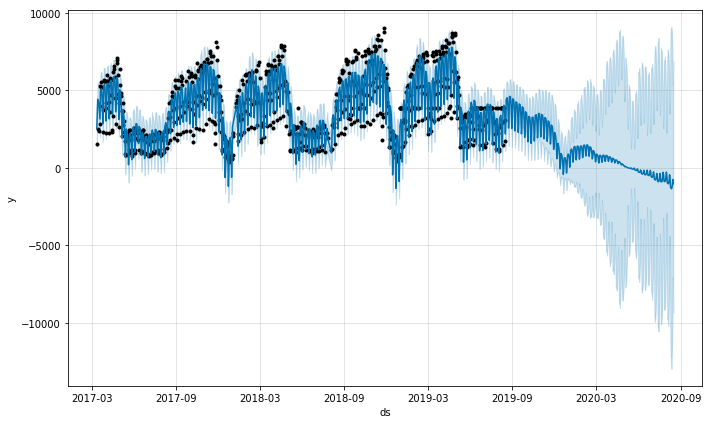

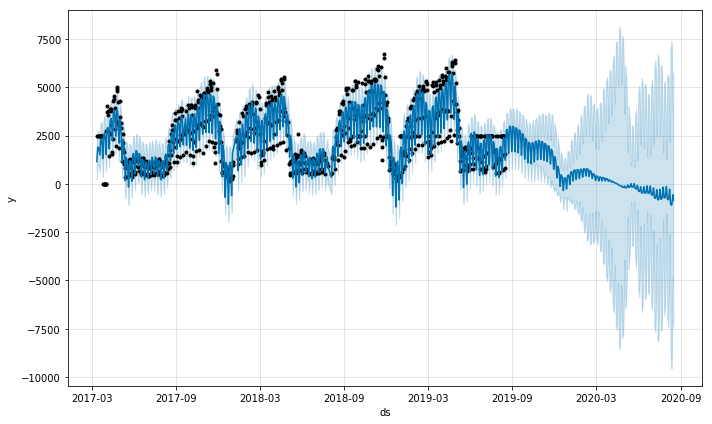

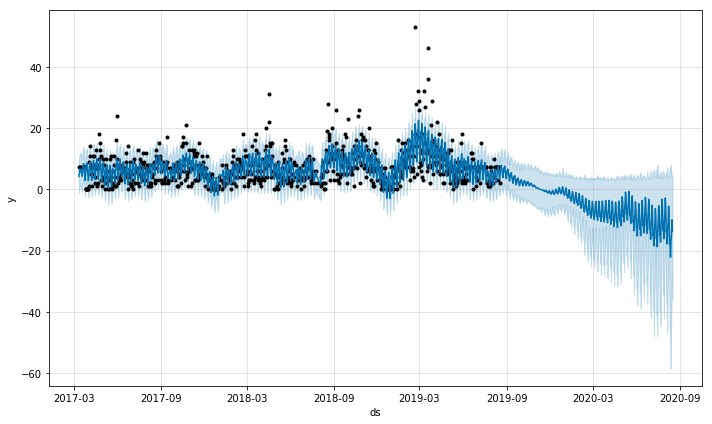

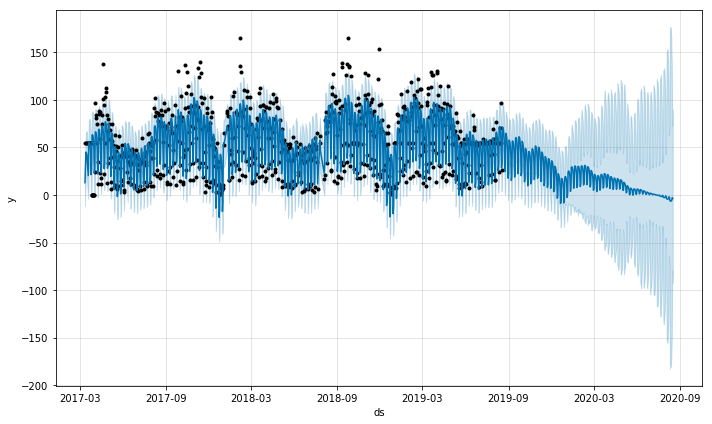

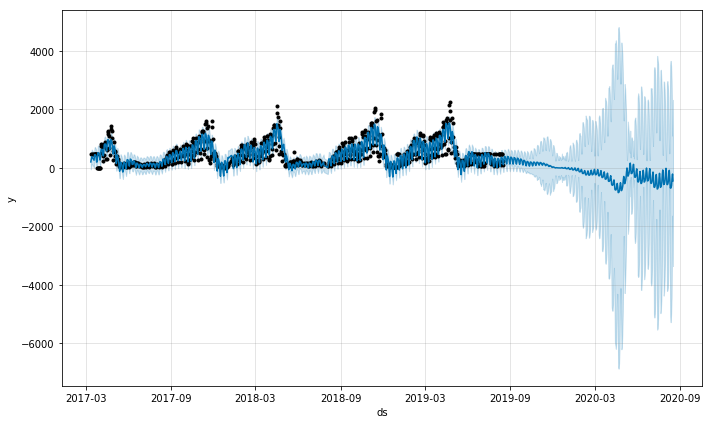

...

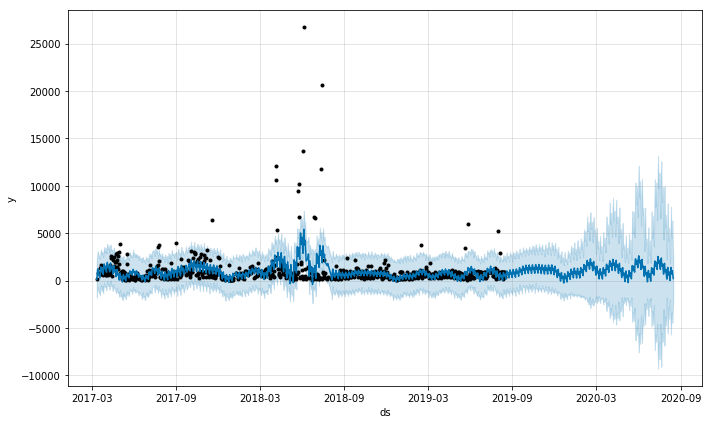

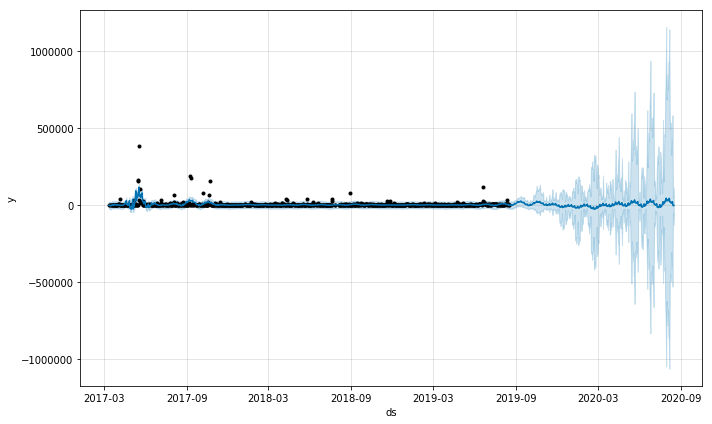

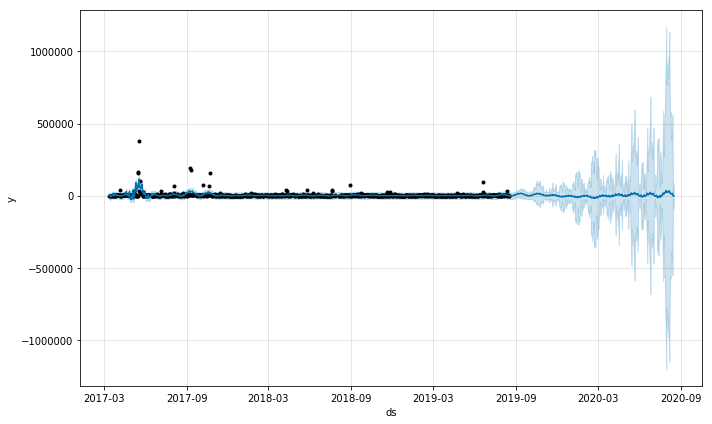

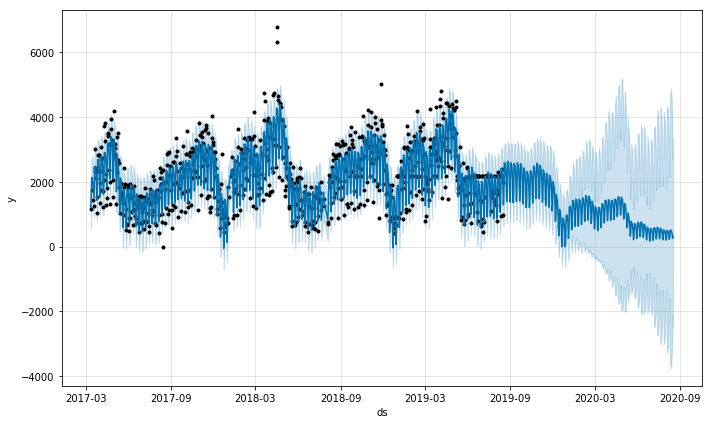

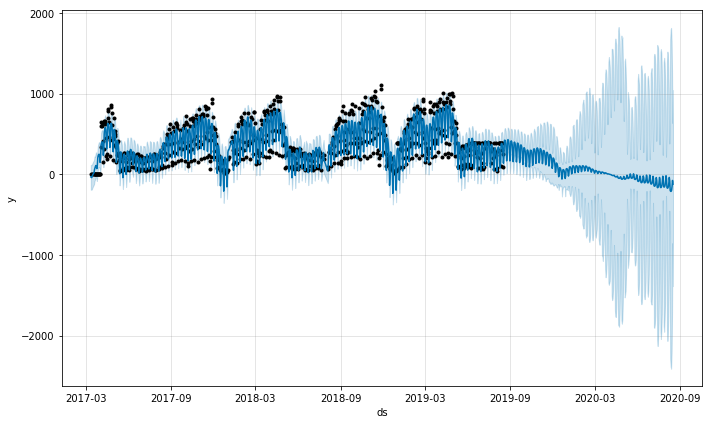

In [71]:
prediction1 = send_prediction(five_att)

From the above predictions and the mape errors we can see that the predictions folllows similar patterns and trends as the current available data. The mape error shows that the predictions in the initial days of prediction is more accurate than the final days of the prediction. We find that mape error is more in few attributes this because of the missing or low data at that point which caused mape to inflate th error.